In [1]:
import pandas as pd, numpy as np
import numpy as np
from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler,Normalizer
import matplotlib.pyplot as plt

In [2]:
file_paths="/kaggle/input/yield-curve-kirk/data_ann (2).csv"

In [3]:
df=pd.read_csv(file_paths)
df.columns = df.columns.str.replace(' ', '')
df.set_index("Date",inplace=True)
#df = df.loc[:,df.columns != "Date"]
df.interpolate(method ='linear', limit_direction ='both',inplace=True)

In [4]:
# develop the linear regression model and outputs
def linear_reg_model(feature_of_Interest):
    '''
    Input: the feature that we are interested in

    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)

    '''
    #feature_of_Interest='GECU3M_lag_1'
    from sklearn.preprocessing import StandardScaler,Normalizer

    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)

    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]
    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)

    #lasso_model = Lasso(alpha=4)
    #lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    #selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train#[list(selected_columns)]
    X_test=X_test#[list(selected_columns)]

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)

    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    from sklearn.linear_model import LinearRegression

    # Assuming X_train and y_train represent your original features and target
    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X_train_normalized, y_train)

    # Use the trained model to predict new values based on X_train
    synthetic_data = model.predict(X_train_normalized)

    # Now y_train_combined contains the original target data along with synthetic data

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    mse_values=(predictions - y_test_forecast)**2
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'synthetic_data':synthetic_data,
           'mse_values':((predictions - y_test_forecast)**2)
          }
    return a

In [5]:
#nn relfeat_non_normalized
def NN_RelFeat_non_normalized(feature_of_Interest):

    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    
    selected_columns = X_train.columns[lasso_model.coef_ != 0]
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized.iloc[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=800, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

In [6]:
#nn relfeat
def NN_RelFeat(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression
    
    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)
    
    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]
    
    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten(), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast.values.flatten(),
           'Predicted_Yield':predictions.flatten()
          }
    return a

In [7]:
#nn TgtOnly
def NN_TgtOnly(feature_of_Interest):

    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''

    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]


    X_train, X_test, y_train, y_test = train_test_split(y[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are your feature sets
    scaler = StandardScaler()
    

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    #y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    #std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    #mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    #std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
    return a


In [8]:
#NN RelFeat+LRdata
def RealFeat_LRdata(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]

    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)

    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train1 = scaler.fit_transform(X_train)
    X_test1 = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized1 = X_train1
    X_test_normalized1 = X_test1

    ###################################################################################
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)

    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)
    # Use the trained model to predict new values based on X_train
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2
    #####################################################################################

    # Normalize train and test sets
    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)

    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))

    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }

    return a
    

In [9]:
#nn TgtOnly + LRdata
def NN_TgtOnly_LRdata(feature_of_Interest):
    
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression

    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)

    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]

    target_columns=[feature_of_Interest]

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]

    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are feature sets

    #selected_features = pd.DataFrame(index=X_train.columns)
    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]

    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]

    scaler = StandardScaler()
    X_train1 = scaler.fit_transform(X_train)
    X_test1 = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized1 = X_train1
    X_test_normalized1 = X_test1

    ###################################################################################
    # Fit a linear regression model
    linear_reg_model1 = LinearRegression()
    linear_reg_model1.fit(X_train_normalized1, y_train)

    # Use the trained model to predict new values based on X_train
    synthetic_data1 = linear_reg_model1.predict(X_train_normalized1)
    synthetic_data2 = linear_reg_model1.predict(X_test_normalized1)

    X_train["LR_model"]=synthetic_data1
    X_test["LR_model"]=synthetic_data2

    X_train[feature_of_Interest]=y_train
    X_test[feature_of_Interest]=y_test

    X_train_normalized = scaler.fit_transform(X_train)
    X_test_normalized = scaler.transform(X_test)
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable

    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1, activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])

    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))

    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)

    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).values.flatten()
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2).flatten()
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2)
          }
    return a

In [10]:
horizons=[1,6,11,16,21]
yields=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse=[]
fig_5={}
table4_data=[]
for i in horizons:
    by_maturity=[]
    for j in yields:
        #print(j+str(i))
        target_=j+str(i)
        a=linear_reg_model(target_)
        b=NN_RelFeat(target_)
        c=NN_TgtOnly(target_)
        d=RealFeat_LRdata(target_)
        e=NN_TgtOnly_LRdata(target_)
        if (i==1 and target_=='GECU10YR_lag_1'):#list_mse1[0][3][1]
            fig_5.update({'Actual_Yield':b['Actual_Yield'],'Predicted_Yield':b['Predicted_Yield'],'GECU10YR_lag_1':b})
            #fig_5.append([b['Actual_Yield'],b['Predicted_Yield']])
        by_maturity.append([a['mse_values'],b['mse_values'],c['mse_values'],d['mse_values'],e['mse_values']])
    list_mse.append(by_maturity)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.913e+00, tolerance: 3.975e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 7.2427 - mae: 2.3744 - mse: 7.2427 - root_mean_squared_error: 2.6912 - val_loss: 4.0901 - val_mae: 1.7963 - val_mse: 4.0901 - val_root_mean_squared_error: 2.0224
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.7579 - mae: 1.6510 - mse: 3.7579 - root_mean_squared_error: 1.9385 - val_loss: 1.7708 - val_mae: 1.1309 - val_mse: 1.7708 - val_root_mean_squared_error: 1.3307
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.3733 - mae: 0.9102 - mse: 1.3733 - root_mean_squared_error: 1.1719 - val_loss: 0.4954 - val_mae: 0.4850 - val_mse: 0.4954 - val_root_mean_squared_error: 0.7038
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6676 - mae: 0.5574 - mse: 0.6676 - root_mean_squared_error: 0.8171 - val_loss: 0.2933 - val_mae: 0.3216 - val_mse: 0.2933 - val_root_mean_squared_error: 0.5416
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.830e+00, tolerance: 4.013e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.6321 - mae: 2.2783 - mse: 6.6321 - root_mean_squared_error: 2.5753 - val_loss: 4.6405 - val_mae: 1.9045 - val_mse: 4.6405 - val_root_mean_squared_error: 2.1542
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.2035 - mae: 1.5484 - mse: 3.2035 - root_mean_squared_error: 1.7898 - val_loss: 1.7036 - val_mae: 1.1063 - val_mse: 1.7036 - val_root_mean_squared_error: 1.3052
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0473 - mae: 0.7839 - mse: 1.0473 - root_mean_squared_error: 1.0234 - val_loss: 0.6236 - val_mae: 0.5785 - val_mse: 0.6236 - val_root_mean_squared_error: 0.7897
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5144 - mae: 0.5087 - mse: 0.5144 - root_mean_squared_error: 0.7172 - val_loss: 0.3955 - val_mae: 0.4610 - val_mse: 0.3955 - val_root_mean_squared_error: 0.6289
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.467e+00, tolerance: 3.982e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.1923 - mae: 2.2784 - mse: 7.1923 - root_mean_squared_error: 2.6818 - val_loss: 6.8943 - val_mae: 2.2444 - val_mse: 6.8943 - val_root_mean_squared_error: 2.6257
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.2811 - mae: 1.4942 - mse: 3.2811 - root_mean_squared_error: 1.8114 - val_loss: 1.9379 - val_mae: 1.1173 - val_mse: 1.9379 - val_root_mean_squared_error: 1.3921
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9996 - mae: 0.7473 - mse: 0.9996 - root_mean_squared_error: 0.9998 - val_loss: 0.3935 - val_mae: 0.4888 - val_mse: 0.3935 - val_root_mean_squared_error: 0.6273
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4892 - mae: 0.4885 - mse: 0.4892 - root_mean_squared_error: 0.6994 - val_loss: 0.1720 - val_mae: 0.3165 - val_mse: 0.1720 - val_root_mean_squared_error: 0.4148
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.594e-01, tolerance: 3.274e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 6.8539 - mae: 2.3396 - mse: 6.8539 - root_mean_squared_error: 2.6180 - val_loss: 4.1297 - val_mae: 1.7837 - val_mse: 4.1297 - val_root_mean_squared_error: 2.0322
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.0281 - mae: 1.4676 - mse: 3.0281 - root_mean_squared_error: 1.7401 - val_loss: 1.1693 - val_mae: 0.8321 - val_mse: 1.1693 - val_root_mean_squared_error: 1.0813
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9058 - mae: 0.7005 - mse: 0.9058 - root_mean_squared_error: 0.9517 - val_loss: 0.4844 - val_mae: 0.5402 - val_mse: 0.4844 - val_root_mean_squared_error: 0.6960
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5295 - mae: 0.5470 - mse: 0.5295 - root_mean_squared_error: 0.7276 - val_loss: 0.4411 - val_mae: 0.5321 - val_mse: 0.4411 - val_root_mean_squared_error: 0.6641
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.826e-01, tolerance: 3.312e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 8.1022 - mae: 2.4781 - mse: 8.1022 - root_mean_squared_error: 2.8464 - val_loss: 5.7381 - val_mae: 2.1009 - val_mse: 5.7381 - val_root_mean_squared_error: 2.3954
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.8955 - mae: 1.6618 - mse: 3.8955 - root_mean_squared_error: 1.9737 - val_loss: 1.7987 - val_mae: 1.1557 - val_mse: 1.7987 - val_root_mean_squared_error: 1.3411
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0145 - mae: 0.7511 - mse: 1.0145 - root_mean_squared_error: 1.0072 - val_loss: 0.3742 - val_mae: 0.4096 - val_mse: 0.3742 - val_root_mean_squared_error: 0.6117
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4799 - mae: 0.4818 - mse: 0.4799 - root_mean_squared_error: 0.6927 - val_loss: 0.3172 - val_mae: 0.3682 - val_mse: 0.3172 - val_root_mean_squared_error: 0.5632
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.452e-01, tolerance: 3.269e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 6.3335 - mae: 2.2796 - mse: 6.3335 - root_mean_squared_error: 2.5166 - val_loss: 3.7222 - val_mae: 1.7438 - val_mse: 3.7222 - val_root_mean_squared_error: 1.9293
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.5339 - mae: 1.3438 - mse: 2.5339 - root_mean_squared_error: 1.5918 - val_loss: 1.1709 - val_mae: 0.8306 - val_mse: 1.1709 - val_root_mean_squared_error: 1.0821
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9693 - mae: 0.7809 - mse: 0.9693 - root_mean_squared_error: 0.9845 - val_loss: 0.5594 - val_mae: 0.6123 - val_mse: 0.5594 - val_root_mean_squared_error: 0.7479
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6136 - mae: 0.6195 - mse: 0.6136 - root_mean_squared_error: 0.7833 - val_loss: 0.3887 - val_mae: 0.5111 - val_mse: 0.3887 - val_root_mean_squared_error: 0.6235
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.264e-01, tolerance: 2.142e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.6607 - mae: 2.8933 - mse: 9.6607 - root_mean_squared_error: 3.1082 - val_loss: 7.3014 - val_mae: 2.5062 - val_mse: 7.3014 - val_root_mean_squared_error: 2.7021
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 5.4278 - mae: 2.0615 - mse: 5.4278 - root_mean_squared_error: 2.3298 - val_loss: 3.4798 - val_mae: 1.6170 - val_mse: 3.4798 - val_root_mean_squared_error: 1.8654
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 2.3632 - mae: 1.2647 - mse: 2.3632 - root_mean_squared_error: 1.5373 - val_loss: 1.0562 - val_mae: 0.8256 - val_mse: 1.0562 - val_root_mean_squared_error: 1.0277
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8813 - mae: 0.7306 - mse: 0.8813 - root_mean_squared_error: 0.9388 - val_loss: 0.5719 - val_mae: 0.6135 - val_mse: 0.5719 - val_root_mean_squared_error: 0.7563
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.052e-01, tolerance: 2.122e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 9.1350 - mae: 2.7805 - mse: 9.1350 - root_mean_squared_error: 3.0224 - val_loss: 6.4000 - val_mae: 2.3071 - val_mse: 6.4000 - val_root_mean_squared_error: 2.5298
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 4.5122 - mae: 1.8452 - mse: 4.5122 - root_mean_squared_error: 2.1242 - val_loss: 2.4273 - val_mae: 1.3417 - val_mse: 2.4273 - val_root_mean_squared_error: 1.5580
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.7572 - mae: 1.0557 - mse: 1.7572 - root_mean_squared_error: 1.3256 - val_loss: 0.8685 - val_mae: 0.7287 - val_mse: 0.8685 - val_root_mean_squared_error: 0.9319
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8213 - mae: 0.7127 - mse: 0.8213 - root_mean_squared_error: 0.9063 - val_loss: 0.6341 - val_mae: 0.5616 - val_mse: 0.6341 - val_root_mean_squared_error: 0.7963
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.921e-01, tolerance: 1.312e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.7531 - mae: 3.1143 - mse: 10.7531 - root_mean_squared_error: 3.2792 - val_loss: 9.7907 - val_mae: 2.8653 - val_mse: 9.7907 - val_root_mean_squared_error: 3.1290
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 6.6415 - mae: 2.3291 - mse: 6.6415 - root_mean_squared_error: 2.5771 - val_loss: 6.3889 - val_mae: 2.2050 - val_mse: 6.3889 - val_root_mean_squared_error: 2.5276
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 3.9254 - mae: 1.7081 - mse: 3.9254 - root_mean_squared_error: 1.9813 - val_loss: 4.0394 - val_mae: 1.6953 - val_mse: 4.0394 - val_root_mean_squared_error: 2.0098
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.4659 - mae: 1.3259 - mse: 2.4659 - root_mean_squared_error: 1.5703 - val_loss: 3.0745 - val_mae: 1.4938 - val_mse: 3.0745 - val_root_mean_squared_error: 1.7534
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.038e-01, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 14.3597 - mae: 3.6569 - mse: 14.3597 - root_mean_squared_error: 3.7894 - val_loss: 11.9474 - val_mae: 3.3147 - val_mse: 11.9474 - val_root_mean_squared_error: 3.4565
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 8.4525 - mae: 2.6605 - mse: 8.4525 - root_mean_squared_error: 2.9073 - val_loss: 6.6852 - val_mae: 2.3950 - val_mse: 6.6852 - val_root_mean_squared_error: 2.5856
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 4.7965 - mae: 1.8888 - mse: 4.7965 - root_mean_squared_error: 2.1901 - val_loss: 3.8233 - val_mae: 1.7742 - val_mse: 3.8233 - val_root_mean_squared_error: 1.9553
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 3.2778 - mae: 1.5571 - mse: 3.2778 - root_mean_squared_error: 1.8105 - val_loss: 2.4953 - val_mae: 1.4119 - val_mse: 2.4953 - val_root_mean_squared_error: 1.5797
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.433e-01, tolerance: 1.174e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 16.5571 - mae: 3.8821 - mse: 16.5571 - root_mean_squared_error: 4.0690 - val_loss: 14.7228 - val_mae: 3.5887 - val_mse: 14.7228 - val_root_mean_squared_error: 3.8370
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 11.3302 - mae: 3.0578 - mse: 11.3302 - root_mean_squared_error: 3.3660 - val_loss: 9.3888 - val_mae: 2.8135 - val_mse: 9.3888 - val_root_mean_squared_error: 3.0641
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 6.0169 - mae: 2.1617 - mse: 6.0169 - root_mean_squared_error: 2.4529 - val_loss: 3.8660 - val_mae: 1.7044 - val_mse: 3.8660 - val_root_mean_squared_error: 1.9662
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.4227 - mae: 1.2902 - mse: 2.4227 - root_mean_squared_error: 1.5565 - val_loss: 1.6055 - val_mae: 1.0386 - val_mse: 1.6055 - val_root_mean_squared_error: 1.2671
Epoch 5/500
33/33 [==============================] - 0

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.537e-01, tolerance: 1.165e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 16ms/step - loss: 16.9517 - mae: 3.9863 - mse: 16.9517 - root_mean_squared_error: 4.1172 - val_loss: 12.5056 - val_mae: 3.3912 - val_mse: 12.5056 - val_root_mean_squared_error: 3.5363
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 9.7520 - mae: 2.9415 - mse: 9.7520 - root_mean_squared_error: 3.1228 - val_loss: 7.0437 - val_mae: 2.3494 - val_mse: 7.0437 - val_root_mean_squared_error: 2.6540
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 4.8074 - mae: 1.8561 - mse: 4.8074 - root_mean_squared_error: 2.1926 - val_loss: 4.0323 - val_mae: 1.5439 - val_mse: 4.0323 - val_root_mean_squared_error: 2.0081
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.5899 - mae: 1.2165 - mse: 2.5899 - root_mean_squared_error: 1.6093 - val_loss: 2.4669 - val_mae: 1.2580 - val_mse: 2.4669 - val_root_mean_squared_error: 1.5706
Epoch 5/500
33/33 [==============================] - 0s

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.241e+00, tolerance: 3.962e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 6.3881 - mae: 2.2111 - mse: 6.3881 - root_mean_squared_error: 2.5275 - val_loss: 3.7670 - val_mae: 1.6946 - val_mse: 3.7670 - val_root_mean_squared_error: 1.9409
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.0439 - mae: 1.4429 - mse: 3.0439 - root_mean_squared_error: 1.7447 - val_loss: 1.2756 - val_mae: 0.9190 - val_mse: 1.2756 - val_root_mean_squared_error: 1.1294
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0652 - mae: 0.7596 - mse: 1.0652 - root_mean_squared_error: 1.0321 - val_loss: 0.5486 - val_mae: 0.4938 - val_mse: 0.5486 - val_root_mean_squared_error: 0.7407
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6752 - mae: 0.5941 - mse: 0.6752 - root_mean_squared_error: 0.8217 - val_loss: 0.4437 - val_mae: 0.4283 - val_mse: 0.4437 - val_root_mean_squared_error: 0.6661
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.337e+00, tolerance: 4.102e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 6.8638 - mae: 2.2827 - mse: 6.8638 - root_mean_squared_error: 2.6199 - val_loss: 4.3157 - val_mae: 1.8402 - val_mse: 4.3157 - val_root_mean_squared_error: 2.0774
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.2840 - mae: 1.5353 - mse: 3.2840 - root_mean_squared_error: 1.8122 - val_loss: 1.5178 - val_mae: 1.0209 - val_mse: 1.5178 - val_root_mean_squared_error: 1.2320
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9281 - mae: 0.7229 - mse: 0.9281 - root_mean_squared_error: 0.9634 - val_loss: 0.6040 - val_mae: 0.6050 - val_mse: 0.6040 - val_root_mean_squared_error: 0.7772
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.3754 - mae: 0.4605 - mse: 0.3754 - root_mean_squared_error: 0.6127 - val_loss: 0.3629 - val_mae: 0.4824 - val_mse: 0.3629 - val_root_mean_squared_error: 0.6024
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.612e+00, tolerance: 4.047e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.3177 - mae: 2.2413 - mse: 6.3177 - root_mean_squared_error: 2.5135 - val_loss: 3.4044 - val_mae: 1.6898 - val_mse: 3.4044 - val_root_mean_squared_error: 1.8451
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.6002 - mae: 1.3535 - mse: 2.6002 - root_mean_squared_error: 1.6125 - val_loss: 1.0270 - val_mae: 0.8538 - val_mse: 1.0270 - val_root_mean_squared_error: 1.0134
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9163 - mae: 0.7267 - mse: 0.9163 - root_mean_squared_error: 0.9572 - val_loss: 0.4669 - val_mae: 0.5290 - val_mse: 0.4669 - val_root_mean_squared_error: 0.6833
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4943 - mae: 0.5218 - mse: 0.4943 - root_mean_squared_error: 0.7031 - val_loss: 0.3373 - val_mae: 0.4704 - val_mse: 0.3373 - val_root_mean_squared_error: 0.5808
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.194e+00, tolerance: 3.268e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.3806 - mae: 1.9045 - mse: 4.3806 - root_mean_squared_error: 2.0930 - val_loss: 3.4362 - val_mae: 1.6017 - val_mse: 3.4362 - val_root_mean_squared_error: 1.8537
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.0291 - mae: 1.2170 - mse: 2.0291 - root_mean_squared_error: 1.4245 - val_loss: 1.6399 - val_mae: 1.0731 - val_mse: 1.6399 - val_root_mean_squared_error: 1.2806
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 0.9336 - mae: 0.7505 - mse: 0.9336 - root_mean_squared_error: 0.9662 - val_loss: 0.7696 - val_mae: 0.6770 - val_mse: 0.7696 - val_root_mean_squared_error: 0.8772
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6307 - mae: 0.5770 - mse: 0.6307 - root_mean_squared_error: 0.7942 - val_loss: 0.6040 - val_mae: 0.6078 - val_mse: 0.6040 - val_root_mean_squared_error: 0.7772
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.374e-01, tolerance: 3.365e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.8461 - mae: 1.9541 - mse: 4.8461 - root_mean_squared_error: 2.2014 - val_loss: 2.1664 - val_mae: 1.2741 - val_mse: 2.1664 - val_root_mean_squared_error: 1.4719
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.1050 - mae: 1.1674 - mse: 2.1050 - root_mean_squared_error: 1.4508 - val_loss: 1.3978 - val_mae: 0.9576 - val_mse: 1.3978 - val_root_mean_squared_error: 1.1823
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.1821 - mae: 0.8385 - mse: 1.1821 - root_mean_squared_error: 1.0873 - val_loss: 0.8572 - val_mae: 0.7305 - val_mse: 0.8572 - val_root_mean_squared_error: 0.9259
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7498 - mae: 0.6447 - mse: 0.7498 - root_mean_squared_error: 0.8659 - val_loss: 0.5547 - val_mae: 0.5628 - val_mse: 0.5547 - val_root_mean_squared_error: 0.7448
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.646e-01, tolerance: 3.262e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.4233 - mae: 1.8885 - mse: 4.4233 - root_mean_squared_error: 2.1032 - val_loss: 3.2419 - val_mae: 1.4917 - val_mse: 3.2419 - val_root_mean_squared_error: 1.8005
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.9767 - mae: 1.1593 - mse: 1.9767 - root_mean_squared_error: 1.4059 - val_loss: 1.6188 - val_mae: 0.9715 - val_mse: 1.6188 - val_root_mean_squared_error: 1.2723
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9356 - mae: 0.7526 - mse: 0.9356 - root_mean_squared_error: 0.9672 - val_loss: 1.1054 - val_mae: 0.7368 - val_mse: 1.1054 - val_root_mean_squared_error: 1.0514
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6341 - mae: 0.5749 - mse: 0.6341 - root_mean_squared_error: 0.7963 - val_loss: 0.8586 - val_mae: 0.5935 - val_mse: 0.8586 - val_root_mean_squared_error: 0.9266
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.606e-01, tolerance: 2.059e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 7.0306 - mae: 2.4864 - mse: 7.0306 - root_mean_squared_error: 2.6515 - val_loss: 5.8451 - val_mae: 2.1713 - val_mse: 5.8451 - val_root_mean_squared_error: 2.4177
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.6556 - mae: 1.6984 - mse: 3.6556 - root_mean_squared_error: 1.9120 - val_loss: 2.9949 - val_mae: 1.4783 - val_mse: 2.9949 - val_root_mean_squared_error: 1.7306
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.5212 - mae: 1.0058 - mse: 1.5212 - root_mean_squared_error: 1.2334 - val_loss: 1.1814 - val_mae: 0.8839 - val_mse: 1.1814 - val_root_mean_squared_error: 1.0869
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8816 - mae: 0.7274 - mse: 0.8816 - root_mean_squared_error: 0.9390 - val_loss: 0.8858 - val_mae: 0.7601 - val_mse: 0.8858 - val_root_mean_squared_error: 0.9412
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.868e-01, tolerance: 2.133e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.1308 - mae: 2.5360 - mse: 7.1308 - root_mean_squared_error: 2.6703 - val_loss: 4.5861 - val_mae: 1.9841 - val_mse: 4.5861 - val_root_mean_squared_error: 2.1415
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.5542 - mae: 1.6803 - mse: 3.5542 - root_mean_squared_error: 1.8853 - val_loss: 2.5876 - val_mae: 1.3883 - val_mse: 2.5876 - val_root_mean_squared_error: 1.6086
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 2.0787 - mae: 1.2323 - mse: 2.0787 - root_mean_squared_error: 1.4418 - val_loss: 1.9350 - val_mae: 1.2270 - val_mse: 1.9350 - val_root_mean_squared_error: 1.3910
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.5703 - mae: 1.0626 - mse: 1.5703 - root_mean_squared_error: 1.2531 - val_loss: 1.5116 - val_mae: 1.0583 - val_mse: 1.5116 - val_root_mean_squared_error: 1.2295
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.272e+00, tolerance: 2.097e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.6629 - mae: 2.3813 - mse: 6.6629 - root_mean_squared_error: 2.5813 - val_loss: 5.0151 - val_mae: 2.0063 - val_mse: 5.0151 - val_root_mean_squared_error: 2.2394
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 3.6219 - mae: 1.6398 - mse: 3.6219 - root_mean_squared_error: 1.9031 - val_loss: 2.6198 - val_mae: 1.4299 - val_mse: 2.6198 - val_root_mean_squared_error: 1.6186
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.0309 - mae: 1.2073 - mse: 2.0309 - root_mean_squared_error: 1.4251 - val_loss: 1.4017 - val_mae: 1.0435 - val_mse: 1.4017 - val_root_mean_squared_error: 1.1840
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.3081 - mae: 0.9493 - mse: 1.3081 - root_mean_squared_error: 1.1437 - val_loss: 0.8677 - val_mae: 0.7871 - val_mse: 0.8677 - val_root_mean_squared_error: 0.9315
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.642e-01, tolerance: 1.302e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.4645 - mae: 3.0369 - mse: 10.4645 - root_mean_squared_error: 3.2349 - val_loss: 9.7031 - val_mae: 2.8888 - val_mse: 9.7031 - val_root_mean_squared_error: 3.1150
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 5.9864 - mae: 2.1413 - mse: 5.9864 - root_mean_squared_error: 2.4467 - val_loss: 5.4777 - val_mae: 2.0798 - val_mse: 5.4777 - val_root_mean_squared_error: 2.3405
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 3.4348 - mae: 1.5549 - mse: 3.4348 - root_mean_squared_error: 1.8533 - val_loss: 3.1720 - val_mae: 1.4584 - val_mse: 3.1720 - val_root_mean_squared_error: 1.7810
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.4078 - mae: 1.2911 - mse: 2.4078 - root_mean_squared_error: 1.5517 - val_loss: 2.2192 - val_mae: 1.2018 - val_mse: 2.2192 - val_root_mean_squared_error: 1.4897
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.371e-01, tolerance: 1.310e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.9102 - mae: 3.1961 - mse: 10.9102 - root_mean_squared_error: 3.3031 - val_loss: 8.5700 - val_mae: 2.7918 - val_mse: 8.5700 - val_root_mean_squared_error: 2.9275
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 6.3041 - mae: 2.3064 - mse: 6.3041 - root_mean_squared_error: 2.5108 - val_loss: 4.9038 - val_mae: 2.0234 - val_mse: 4.9038 - val_root_mean_squared_error: 2.2145
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 3.6274 - mae: 1.6428 - mse: 3.6274 - root_mean_squared_error: 1.9046 - val_loss: 3.0462 - val_mae: 1.5057 - val_mse: 3.0462 - val_root_mean_squared_error: 1.7453
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.3658 - mae: 1.3322 - mse: 2.3658 - root_mean_squared_error: 1.5381 - val_loss: 2.0726 - val_mae: 1.2250 - val_mse: 2.0726 - val_root_mean_squared_error: 1.4396
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.777e-01, tolerance: 1.122e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 14.7082 - mae: 3.7342 - mse: 14.7082 - root_mean_squared_error: 3.8351 - val_loss: 11.3581 - val_mae: 3.2648 - val_mse: 11.3581 - val_root_mean_squared_error: 3.3702
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 8.5716 - mae: 2.7352 - mse: 8.5716 - root_mean_squared_error: 2.9277 - val_loss: 6.3487 - val_mae: 2.2951 - val_mse: 6.3487 - val_root_mean_squared_error: 2.5197
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 5.1109 - mae: 1.9282 - mse: 5.1109 - root_mean_squared_error: 2.2607 - val_loss: 3.6320 - val_mae: 1.6977 - val_mse: 3.6320 - val_root_mean_squared_error: 1.9058
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 3.3311 - mae: 1.5424 - mse: 3.3311 - root_mean_squared_error: 1.8251 - val_loss: 2.3506 - val_mae: 1.3615 - val_mse: 2.3506 - val_root_mean_squared_error: 1.5332
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - l

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.966e-01, tolerance: 1.133e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 16.3490 - mae: 3.9251 - mse: 16.3490 - root_mean_squared_error: 4.0434 - val_loss: 13.1912 - val_mae: 3.5358 - val_mse: 13.1912 - val_root_mean_squared_error: 3.6320
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 9.0697 - mae: 2.8231 - mse: 9.0697 - root_mean_squared_error: 3.0116 - val_loss: 7.1363 - val_mae: 2.4836 - val_mse: 7.1363 - val_root_mean_squared_error: 2.6714
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 3.9975 - mae: 1.7222 - mse: 3.9975 - root_mean_squared_error: 1.9994 - val_loss: 3.4717 - val_mae: 1.6288 - val_mse: 3.4717 - val_root_mean_squared_error: 1.8633
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.1916 - mae: 1.2511 - mse: 2.1916 - root_mean_squared_error: 1.4804 - val_loss: 2.0581 - val_mae: 1.1573 - val_mse: 2.0581 - val_root_mean_squared_error: 1.4346
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.698e-01, tolerance: 1.142e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 11ms/step - loss: 13.8649 - mae: 3.6165 - mse: 13.8649 - root_mean_squared_error: 3.7236 - val_loss: 10.6543 - val_mae: 3.1157 - val_mse: 10.6543 - val_root_mean_squared_error: 3.2641
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 7.6605 - mae: 2.5210 - mse: 7.6605 - root_mean_squared_error: 2.7678 - val_loss: 5.9733 - val_mae: 2.1038 - val_mse: 5.9733 - val_root_mean_squared_error: 2.4440
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 4.5459 - mae: 1.8177 - mse: 4.5459 - root_mean_squared_error: 2.1321 - val_loss: 4.0430 - val_mae: 1.6741 - val_mse: 4.0430 - val_root_mean_squared_error: 2.0107
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.2554 - mae: 1.5416 - mse: 3.2554 - root_mean_squared_error: 1.8043 - val_loss: 2.9036 - val_mae: 1.3893 - val_mse: 2.9036 - val_root_mean_squared_error: 1.7040
Epoch 5/500
33/33 [==============================] - 0s

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.572e+00, tolerance: 3.955e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 6.6631 - mae: 2.2625 - mse: 6.6631 - root_mean_squared_error: 2.5813 - val_loss: 3.9703 - val_mae: 1.7549 - val_mse: 3.9703 - val_root_mean_squared_error: 1.9926
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.0826 - mae: 1.4520 - mse: 3.0826 - root_mean_squared_error: 1.7557 - val_loss: 1.3738 - val_mae: 0.9564 - val_mse: 1.3738 - val_root_mean_squared_error: 1.1721
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.1760 - mae: 0.7911 - mse: 1.1760 - root_mean_squared_error: 1.0844 - val_loss: 0.5961 - val_mae: 0.5033 - val_mse: 0.5961 - val_root_mean_squared_error: 0.7721
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7752 - mae: 0.6234 - mse: 0.7752 - root_mean_squared_error: 0.8805 - val_loss: 0.5007 - val_mae: 0.4574 - val_mse: 0.5007 - val_root_mean_squared_error: 0.7076
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.515e+00, tolerance: 4.100e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.8771 - mae: 2.2281 - mse: 6.8771 - root_mean_squared_error: 2.6224 - val_loss: 4.5081 - val_mae: 1.8228 - val_mse: 4.5081 - val_root_mean_squared_error: 2.1232
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.0917 - mae: 1.4325 - mse: 3.0917 - root_mean_squared_error: 1.7583 - val_loss: 1.8530 - val_mae: 1.0841 - val_mse: 1.8530 - val_root_mean_squared_error: 1.3612
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.1946 - mae: 0.7980 - mse: 1.1946 - root_mean_squared_error: 1.0930 - val_loss: 0.7432 - val_mae: 0.5799 - val_mse: 0.7432 - val_root_mean_squared_error: 0.8621
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6697 - mae: 0.5809 - mse: 0.6697 - root_mean_squared_error: 0.8184 - val_loss: 0.5436 - val_mae: 0.4825 - val_mse: 0.5436 - val_root_mean_squared_error: 0.7373
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.183e+00, tolerance: 3.950e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 6.3452 - mae: 2.2153 - mse: 6.3452 - root_mean_squared_error: 2.5190 - val_loss: 4.1452 - val_mae: 1.8619 - val_mse: 4.1452 - val_root_mean_squared_error: 2.0360
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.7485 - mae: 1.4080 - mse: 2.7485 - root_mean_squared_error: 1.6578 - val_loss: 1.2147 - val_mae: 0.9238 - val_mse: 1.2147 - val_root_mean_squared_error: 1.1021
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9242 - mae: 0.7437 - mse: 0.9242 - root_mean_squared_error: 0.9614 - val_loss: 0.4460 - val_mae: 0.5294 - val_mse: 0.4460 - val_root_mean_squared_error: 0.6678
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.4558 - mae: 0.4711 - mse: 0.4558 - root_mean_squared_error: 0.6751 - val_loss: 0.2732 - val_mae: 0.4124 - val_mse: 0.2732 - val_root_mean_squared_error: 0.5227
Epoch 5/500
33/33 [==============================] - 0s 4ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.855e-01, tolerance: 3.260e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 4.5461 - mae: 1.9159 - mse: 4.5461 - root_mean_squared_error: 2.1322 - val_loss: 3.2806 - val_mae: 1.5352 - val_mse: 3.2806 - val_root_mean_squared_error: 1.8112
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.8252 - mae: 1.0928 - mse: 1.8252 - root_mean_squared_error: 1.3510 - val_loss: 1.3341 - val_mae: 0.9057 - val_mse: 1.3341 - val_root_mean_squared_error: 1.1550
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9645 - mae: 0.7406 - mse: 0.9645 - root_mean_squared_error: 0.9821 - val_loss: 0.7920 - val_mae: 0.6841 - val_mse: 0.7920 - val_root_mean_squared_error: 0.8900
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6585 - mae: 0.5732 - mse: 0.6585 - root_mean_squared_error: 0.8115 - val_loss: 0.6103 - val_mae: 0.6026 - val_mse: 0.6103 - val_root_mean_squared_error: 0.7812
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.169e+00, tolerance: 3.281e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.1808 - mae: 2.1662 - mse: 6.1808 - root_mean_squared_error: 2.4861 - val_loss: 2.6869 - val_mae: 1.4041 - val_mse: 2.6869 - val_root_mean_squared_error: 1.6392
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.8263 - mae: 1.3373 - mse: 2.8263 - root_mean_squared_error: 1.6812 - val_loss: 0.8682 - val_mae: 0.7168 - val_mse: 0.8682 - val_root_mean_squared_error: 0.9318
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.3589 - mae: 0.8610 - mse: 1.3589 - root_mean_squared_error: 1.1657 - val_loss: 0.4941 - val_mae: 0.5550 - val_mse: 0.4941 - val_root_mean_squared_error: 0.7029
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8148 - mae: 0.6529 - mse: 0.8148 - root_mean_squared_error: 0.9027 - val_loss: 0.2986 - val_mae: 0.4332 - val_mse: 0.2986 - val_root_mean_squared_error: 0.5465
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.489e-01, tolerance: 3.290e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 4.9293 - mae: 2.0666 - mse: 4.9293 - root_mean_squared_error: 2.2202 - val_loss: 2.7822 - val_mae: 1.5086 - val_mse: 2.7822 - val_root_mean_squared_error: 1.6680
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.1999 - mae: 1.2900 - mse: 2.1999 - root_mean_squared_error: 1.4832 - val_loss: 1.2963 - val_mae: 1.0415 - val_mse: 1.2963 - val_root_mean_squared_error: 1.1386
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0470 - mae: 0.8377 - mse: 1.0470 - root_mean_squared_error: 1.0232 - val_loss: 0.5579 - val_mae: 0.6688 - val_mse: 0.5579 - val_root_mean_squared_error: 0.7469
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6845 - mae: 0.6315 - mse: 0.6845 - root_mean_squared_error: 0.8273 - val_loss: 0.3214 - val_mae: 0.4761 - val_mse: 0.3214 - val_root_mean_squared_error: 0.5669
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.904e-01, tolerance: 2.041e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 6.3079 - mae: 2.3657 - mse: 6.3079 - root_mean_squared_error: 2.5116 - val_loss: 5.1394 - val_mae: 2.0879 - val_mse: 5.1394 - val_root_mean_squared_error: 2.2670
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.2795 - mae: 1.5514 - mse: 3.2795 - root_mean_squared_error: 1.8109 - val_loss: 2.7014 - val_mae: 1.4835 - val_mse: 2.7014 - val_root_mean_squared_error: 1.6436
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 2.0428 - mae: 1.1900 - mse: 2.0428 - root_mean_squared_error: 1.4293 - val_loss: 1.5559 - val_mae: 1.0749 - val_mse: 1.5559 - val_root_mean_squared_error: 1.2473
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.5307 - mae: 0.9874 - mse: 1.5307 - root_mean_squared_error: 1.2372 - val_loss: 1.1033 - val_mae: 0.8502 - val_mse: 1.1033 - val_root_mean_squared_error: 1.0504
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.406e-01, tolerance: 2.066e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.0573 - mae: 2.5426 - mse: 7.0573 - root_mean_squared_error: 2.6565 - val_loss: 4.6756 - val_mae: 1.9928 - val_mse: 4.6756 - val_root_mean_squared_error: 2.1623
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.2343 - mae: 1.6112 - mse: 3.2343 - root_mean_squared_error: 1.7984 - val_loss: 2.2630 - val_mae: 1.3215 - val_mse: 2.2630 - val_root_mean_squared_error: 1.5043
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.7782 - mae: 1.1354 - mse: 1.7782 - root_mean_squared_error: 1.3335 - val_loss: 1.4271 - val_mae: 0.9636 - val_mse: 1.4271 - val_root_mean_squared_error: 1.1946
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.2223 - mae: 0.9023 - mse: 1.2223 - root_mean_squared_error: 1.1056 - val_loss: 1.0159 - val_mae: 0.7813 - val_mse: 1.0159 - val_root_mean_squared_error: 1.0079
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.921e-01, tolerance: 2.103e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 7.3620 - mae: 2.5074 - mse: 7.3620 - root_mean_squared_error: 2.7133 - val_loss: 5.7657 - val_mae: 2.1865 - val_mse: 5.7657 - val_root_mean_squared_error: 2.4012
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 4.3759 - mae: 1.7738 - mse: 4.3759 - root_mean_squared_error: 2.0919 - val_loss: 3.2354 - val_mae: 1.4720 - val_mse: 3.2354 - val_root_mean_squared_error: 1.7987
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 2.6124 - mae: 1.3046 - mse: 2.6124 - root_mean_squared_error: 1.6163 - val_loss: 1.8170 - val_mae: 1.0868 - val_mse: 1.8170 - val_root_mean_squared_error: 1.3480
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.6459 - mae: 1.0380 - mse: 1.6459 - root_mean_squared_error: 1.2829 - val_loss: 1.3678 - val_mae: 0.9572 - val_mse: 1.3678 - val_root_mean_squared_error: 1.1695
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.594e-01, tolerance: 1.265e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 10.4829 - mae: 3.0697 - mse: 10.4829 - root_mean_squared_error: 3.2377 - val_loss: 9.1980 - val_mae: 2.8365 - val_mse: 9.1980 - val_root_mean_squared_error: 3.0328
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 6.2770 - mae: 2.2698 - mse: 6.2770 - root_mean_squared_error: 2.5054 - val_loss: 5.8097 - val_mae: 2.2806 - val_mse: 5.8097 - val_root_mean_squared_error: 2.4103
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 3.6460 - mae: 1.6547 - mse: 3.6460 - root_mean_squared_error: 1.9095 - val_loss: 3.1799 - val_mae: 1.6491 - val_mse: 3.1799 - val_root_mean_squared_error: 1.7832
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.4709 - mae: 1.3768 - mse: 2.4709 - root_mean_squared_error: 1.5719 - val_loss: 2.0926 - val_mae: 1.3372 - val_mse: 2.0926 - val_root_mean_squared_error: 1.4466
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.852e-01, tolerance: 1.288e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.6842 - mae: 3.1089 - mse: 10.6842 - root_mean_squared_error: 3.2687 - val_loss: 9.3988 - val_mae: 2.8428 - val_mse: 9.3988 - val_root_mean_squared_error: 3.0658
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 6.1580 - mae: 2.1811 - mse: 6.1580 - root_mean_squared_error: 2.4815 - val_loss: 5.3041 - val_mae: 1.9369 - val_mse: 5.3041 - val_root_mean_squared_error: 2.3031
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 3.7469 - mae: 1.6538 - mse: 3.7469 - root_mean_squared_error: 1.9357 - val_loss: 3.5124 - val_mae: 1.5445 - val_mse: 3.5124 - val_root_mean_squared_error: 1.8741
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.8399 - mae: 1.4417 - mse: 2.8399 - root_mean_squared_error: 1.6852 - val_loss: 2.7569 - val_mae: 1.3822 - val_mse: 2.7569 - val_root_mean_squared_error: 1.6604
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.752e-01, tolerance: 1.111e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 17.7026 - mae: 4.0869 - mse: 17.7026 - root_mean_squared_error: 4.2074 - val_loss: 14.0164 - val_mae: 3.5973 - val_mse: 14.0164 - val_root_mean_squared_error: 3.7438
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 10.9401 - mae: 3.1453 - mse: 10.9401 - root_mean_squared_error: 3.3076 - val_loss: 7.1885 - val_mae: 2.4791 - val_mse: 7.1885 - val_root_mean_squared_error: 2.6811
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 5.4072 - mae: 2.0316 - mse: 5.4072 - root_mean_squared_error: 2.3253 - val_loss: 3.1793 - val_mae: 1.4904 - val_mse: 3.1793 - val_root_mean_squared_error: 1.7830
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.5379 - mae: 1.2957 - mse: 2.5379 - root_mean_squared_error: 1.5931 - val_loss: 1.7424 - val_mae: 1.1157 - val_mse: 1.7424 - val_root_mean_squared_error: 1.3200
Epoch 5/500
33/33 [==============================] - 0s 3ms/step -

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.127e-01, tolerance: 1.122e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 17.4447 - mae: 4.0359 - mse: 17.4447 - root_mean_squared_error: 4.1767 - val_loss: 14.0313 - val_mae: 3.5720 - val_mse: 14.0313 - val_root_mean_squared_error: 3.7458
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 10.8673 - mae: 3.0644 - mse: 10.8673 - root_mean_squared_error: 3.2966 - val_loss: 8.2982 - val_mae: 2.6251 - val_mse: 8.2982 - val_root_mean_squared_error: 2.8807
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 5.4443 - mae: 2.0487 - mse: 5.4443 - root_mean_squared_error: 2.3333 - val_loss: 4.6321 - val_mae: 1.8033 - val_mse: 4.6321 - val_root_mean_squared_error: 2.1522
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.6908 - mae: 1.2708 - mse: 2.6908 - root_mean_squared_error: 1.6404 - val_loss: 1.8977 - val_mae: 1.1286 - val_mse: 1.8977 - val_root_mean_squared_error: 1.3776
Epoch 5/500
33/33 [==============================] - 0

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.719e-01, tolerance: 1.139e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 16.5192 - mae: 3.9303 - mse: 16.5192 - root_mean_squared_error: 4.0644 - val_loss: 13.6604 - val_mae: 3.5392 - val_mse: 13.6604 - val_root_mean_squared_error: 3.6960
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 10.1081 - mae: 2.9738 - mse: 10.1081 - root_mean_squared_error: 3.1793 - val_loss: 7.6622 - val_mae: 2.5675 - val_mse: 7.6622 - val_root_mean_squared_error: 2.7681
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 5.7886 - mae: 2.1303 - mse: 5.7886 - root_mean_squared_error: 2.4060 - val_loss: 4.0330 - val_mae: 1.7100 - val_mse: 4.0330 - val_root_mean_squared_error: 2.0082
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 3.1646 - mae: 1.4625 - mse: 3.1646 - root_mean_squared_error: 1.7789 - val_loss: 2.5264 - val_mae: 1.3412 - val_mse: 2.5264 - val_root_mean_squared_error: 1.5895
Epoch 5/500
33/33 [==============================] - 0

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.981e+00, tolerance: 3.941e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.4865 - mae: 2.1777 - mse: 6.4865 - root_mean_squared_error: 2.5469 - val_loss: 3.3230 - val_mae: 1.5653 - val_mse: 3.3230 - val_root_mean_squared_error: 1.8229
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.9536 - mae: 1.3613 - mse: 2.9536 - root_mean_squared_error: 1.7186 - val_loss: 1.2447 - val_mae: 0.8314 - val_mse: 1.2447 - val_root_mean_squared_error: 1.1157
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.2401 - mae: 0.7845 - mse: 1.2401 - root_mean_squared_error: 1.1136 - val_loss: 0.6372 - val_mae: 0.5494 - val_mse: 0.6372 - val_root_mean_squared_error: 0.7982
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8149 - mae: 0.6357 - mse: 0.8149 - root_mean_squared_error: 0.9027 - val_loss: 0.5322 - val_mae: 0.5110 - val_mse: 0.5322 - val_root_mean_squared_error: 0.7295
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.057e+00, tolerance: 3.993e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.7226 - mae: 1.8266 - mse: 4.7226 - root_mean_squared_error: 2.1732 - val_loss: 2.8532 - val_mae: 1.4109 - val_mse: 2.8532 - val_root_mean_squared_error: 1.6892
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.0131 - mae: 1.0251 - mse: 2.0131 - root_mean_squared_error: 1.4188 - val_loss: 1.0973 - val_mae: 0.7981 - val_mse: 1.0973 - val_root_mean_squared_error: 1.0475
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0241 - mae: 0.7142 - mse: 1.0241 - root_mean_squared_error: 1.0120 - val_loss: 0.7416 - val_mae: 0.6759 - val_mse: 0.7416 - val_root_mean_squared_error: 0.8611
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6319 - mae: 0.5559 - mse: 0.6319 - root_mean_squared_error: 0.7949 - val_loss: 0.5301 - val_mae: 0.5580 - val_mse: 0.5301 - val_root_mean_squared_error: 0.7280
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.011e+00, tolerance: 3.979e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 6.4039 - mae: 2.1109 - mse: 6.4039 - root_mean_squared_error: 2.5306 - val_loss: 3.8760 - val_mae: 1.5930 - val_mse: 3.8760 - val_root_mean_squared_error: 1.9688
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.7583 - mae: 1.2621 - mse: 2.7583 - root_mean_squared_error: 1.6608 - val_loss: 1.1681 - val_mae: 0.7574 - val_mse: 1.1681 - val_root_mean_squared_error: 1.0808
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.1303 - mae: 0.7463 - mse: 1.1303 - root_mean_squared_error: 1.0631 - val_loss: 0.6605 - val_mae: 0.5803 - val_mse: 0.6605 - val_root_mean_squared_error: 0.8127
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7038 - mae: 0.5752 - mse: 0.7038 - root_mean_squared_error: 0.8389 - val_loss: 0.3977 - val_mae: 0.4700 - val_mse: 0.3977 - val_root_mean_squared_error: 0.6306
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.638e+00, tolerance: 3.246e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.0804 - mae: 2.0934 - mse: 5.0804 - root_mean_squared_error: 2.2540 - val_loss: 3.2741 - val_mae: 1.6080 - val_mse: 3.2741 - val_root_mean_squared_error: 1.8095
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.1134 - mae: 1.2333 - mse: 2.1134 - root_mean_squared_error: 1.4538 - val_loss: 1.4983 - val_mae: 1.0001 - val_mse: 1.4983 - val_root_mean_squared_error: 1.2241
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.1204 - mae: 0.8195 - mse: 1.1204 - root_mean_squared_error: 1.0585 - val_loss: 0.8651 - val_mae: 0.6851 - val_mse: 0.8651 - val_root_mean_squared_error: 0.9301
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8347 - mae: 0.6554 - mse: 0.8347 - root_mean_squared_error: 0.9136 - val_loss: 0.6522 - val_mae: 0.5695 - val_mse: 0.6522 - val_root_mean_squared_error: 0.8076
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.963e+00, tolerance: 3.272e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.5358 - mae: 1.9829 - mse: 4.5358 - root_mean_squared_error: 2.1298 - val_loss: 2.4847 - val_mae: 1.3795 - val_mse: 2.4847 - val_root_mean_squared_error: 1.5763
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 1.7157 - mae: 1.1030 - mse: 1.7157 - root_mean_squared_error: 1.3098 - val_loss: 1.3025 - val_mae: 0.9249 - val_mse: 1.3025 - val_root_mean_squared_error: 1.1413
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0235 - mae: 0.8174 - mse: 1.0235 - root_mean_squared_error: 1.0117 - val_loss: 1.0008 - val_mae: 0.7719 - val_mse: 1.0008 - val_root_mean_squared_error: 1.0004
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7304 - mae: 0.6683 - mse: 0.7304 - root_mean_squared_error: 0.8546 - val_loss: 0.6864 - val_mae: 0.5927 - val_mse: 0.6864 - val_root_mean_squared_error: 0.8285
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.042e-01, tolerance: 3.249e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.7107 - mae: 1.9625 - mse: 4.7107 - root_mean_squared_error: 2.1704 - val_loss: 3.5767 - val_mae: 1.7089 - val_mse: 3.5767 - val_root_mean_squared_error: 1.8912
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.2285 - mae: 1.2928 - mse: 2.2285 - root_mean_squared_error: 1.4928 - val_loss: 1.7108 - val_mae: 1.1212 - val_mse: 1.7108 - val_root_mean_squared_error: 1.3080
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.0269 - mae: 0.8272 - mse: 1.0269 - root_mean_squared_error: 1.0133 - val_loss: 0.7695 - val_mae: 0.7065 - val_mse: 0.7695 - val_root_mean_squared_error: 0.8772
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 0.6029 - mae: 0.5714 - mse: 0.6029 - root_mean_squared_error: 0.7765 - val_loss: 0.5179 - val_mae: 0.5430 - val_mse: 0.5179 - val_root_mean_squared_error: 0.7197
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.759e-01, tolerance: 2.031e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 7.2274 - mae: 2.5791 - mse: 7.2274 - root_mean_squared_error: 2.6884 - val_loss: 5.6281 - val_mae: 2.2388 - val_mse: 5.6281 - val_root_mean_squared_error: 2.3724
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.7787 - mae: 1.7242 - mse: 3.7787 - root_mean_squared_error: 1.9439 - val_loss: 2.7564 - val_mae: 1.4862 - val_mse: 2.7564 - val_root_mean_squared_error: 1.6602
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.9920 - mae: 1.1637 - mse: 1.9920 - root_mean_squared_error: 1.4114 - val_loss: 1.2875 - val_mae: 0.9912 - val_mse: 1.2875 - val_root_mean_squared_error: 1.1347
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.4132 - mae: 0.9508 - mse: 1.4132 - root_mean_squared_error: 1.1888 - val_loss: 0.8751 - val_mae: 0.7663 - val_mse: 0.8751 - val_root_mean_squared_error: 0.9355
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.616e-01, tolerance: 2.112e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 7.2754 - mae: 2.5979 - mse: 7.2754 - root_mean_squared_error: 2.6973 - val_loss: 4.9034 - val_mae: 2.0457 - val_mse: 4.9034 - val_root_mean_squared_error: 2.2144
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.6392 - mae: 1.7010 - mse: 3.6392 - root_mean_squared_error: 1.9077 - val_loss: 2.6667 - val_mae: 1.3396 - val_mse: 2.6667 - val_root_mean_squared_error: 1.6330
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 2.0918 - mae: 1.2266 - mse: 2.0918 - root_mean_squared_error: 1.4463 - val_loss: 2.2752 - val_mae: 1.2685 - val_mse: 2.2752 - val_root_mean_squared_error: 1.5084
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.7091 - mae: 1.0662 - mse: 1.7091 - root_mean_squared_error: 1.3073 - val_loss: 1.9549 - val_mae: 1.1425 - val_mse: 1.9549 - val_root_mean_squared_error: 1.3982
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.435e-01, tolerance: 2.078e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 7.9728 - mae: 2.6791 - mse: 7.9728 - root_mean_squared_error: 2.8236 - val_loss: 6.5852 - val_mae: 2.4372 - val_mse: 6.5852 - val_root_mean_squared_error: 2.5662
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.9881 - mae: 1.7926 - mse: 3.9881 - root_mean_squared_error: 1.9970 - val_loss: 2.5884 - val_mae: 1.4730 - val_mse: 2.5884 - val_root_mean_squared_error: 1.6088
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.8625 - mae: 1.1747 - mse: 1.8625 - root_mean_squared_error: 1.3647 - val_loss: 1.0143 - val_mae: 0.8719 - val_mse: 1.0143 - val_root_mean_squared_error: 1.0071
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.1940 - mae: 0.9196 - mse: 1.1940 - root_mean_squared_error: 1.0927 - val_loss: 0.6518 - val_mae: 0.6931 - val_mse: 0.6518 - val_root_mean_squared_error: 0.8074
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.842e-01, tolerance: 1.264e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 10.6898 - mae: 3.1412 - mse: 10.6898 - root_mean_squared_error: 3.2695 - val_loss: 8.5789 - val_mae: 2.7602 - val_mse: 8.5789 - val_root_mean_squared_error: 2.9290
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 5.7921 - mae: 2.1893 - mse: 5.7921 - root_mean_squared_error: 2.4067 - val_loss: 4.4991 - val_mae: 1.9248 - val_mse: 4.4991 - val_root_mean_squared_error: 2.1211
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 2.8913 - mae: 1.4649 - mse: 2.8913 - root_mean_squared_error: 1.7004 - val_loss: 2.1602 - val_mae: 1.2802 - val_mse: 2.1602 - val_root_mean_squared_error: 1.4698
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.7250 - mae: 1.0983 - mse: 1.7250 - root_mean_squared_error: 1.3134 - val_loss: 1.4242 - val_mae: 1.0404 - val_mse: 1.4242 - val_root_mean_squared_error: 1.1934
Epoch 5/500
33/33 [==============================] - 0s 3

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.112e-01, tolerance: 1.300e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 10.8795 - mae: 3.1474 - mse: 10.8795 - root_mean_squared_error: 3.2984 - val_loss: 7.5090 - val_mae: 2.5902 - val_mse: 7.5090 - val_root_mean_squared_error: 2.7403
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 5.6097 - mae: 2.0936 - mse: 5.6097 - root_mean_squared_error: 2.3685 - val_loss: 2.9797 - val_mae: 1.4264 - val_mse: 2.9797 - val_root_mean_squared_error: 1.7262
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 2.8778 - mae: 1.4422 - mse: 2.8778 - root_mean_squared_error: 1.6964 - val_loss: 1.7155 - val_mae: 1.0235 - val_mse: 1.7155 - val_root_mean_squared_error: 1.3098
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.8685 - mae: 1.1380 - mse: 1.8685 - root_mean_squared_error: 1.3669 - val_loss: 1.2724 - val_mae: 0.8704 - val_mse: 1.2724 - val_root_mean_squared_error: 1.1280
Epoch 5/500
33/33 [==============================] - 0s 3

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.437e-01, tolerance: 1.289e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 9.9541 - mae: 3.0416 - mse: 9.9541 - root_mean_squared_error: 3.1550 - val_loss: 8.1753 - val_mae: 2.6907 - val_mse: 8.1753 - val_root_mean_squared_error: 2.8593
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 5.3756 - mae: 2.0670 - mse: 5.3756 - root_mean_squared_error: 2.3185 - val_loss: 5.0647 - val_mae: 1.9651 - val_mse: 5.0647 - val_root_mean_squared_error: 2.2505
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 3.4258 - mae: 1.5899 - mse: 3.4258 - root_mean_squared_error: 1.8509 - val_loss: 4.0594 - val_mae: 1.7340 - val_mse: 4.0594 - val_root_mean_squared_error: 2.0148
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.6525 - mae: 1.3984 - mse: 2.6525 - root_mean_squared_error: 1.6286 - val_loss: 3.2437 - val_mae: 1.5151 - val_mse: 3.2437 - val_root_mean_squared_error: 1.8010
Epoch 5/500
33/33 [==============================] - 0s 4ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.747e-01, tolerance: 1.110e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 14.0320 - mae: 3.5543 - mse: 14.0320 - root_mean_squared_error: 3.7459 - val_loss: 12.2890 - val_mae: 3.2765 - val_mse: 12.2890 - val_root_mean_squared_error: 3.5056
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 9.2425 - mae: 2.7425 - mse: 9.2425 - root_mean_squared_error: 3.0401 - val_loss: 7.8056 - val_mae: 2.6526 - val_mse: 7.8056 - val_root_mean_squared_error: 2.7938
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 5.7811 - mae: 2.1113 - mse: 5.7811 - root_mean_squared_error: 2.4044 - val_loss: 4.2818 - val_mae: 1.9065 - val_mse: 4.2818 - val_root_mean_squared_error: 2.0693
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 3.5596 - mae: 1.6350 - mse: 3.5596 - root_mean_squared_error: 1.8867 - val_loss: 2.4544 - val_mae: 1.4317 - val_mse: 2.4544 - val_root_mean_squared_error: 1.5666
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.145e-01, tolerance: 1.110e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 13.5579 - mae: 3.5194 - mse: 13.5579 - root_mean_squared_error: 3.6821 - val_loss: 9.7577 - val_mae: 2.8946 - val_mse: 9.7577 - val_root_mean_squared_error: 3.1237
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 8.5661 - mae: 2.6411 - mse: 8.5661 - root_mean_squared_error: 2.9268 - val_loss: 6.1056 - val_mae: 2.1145 - val_mse: 6.1056 - val_root_mean_squared_error: 2.4710
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 5.0240 - mae: 1.9328 - mse: 5.0240 - root_mean_squared_error: 2.2414 - val_loss: 3.9466 - val_mae: 1.6066 - val_mse: 3.9466 - val_root_mean_squared_error: 1.9866
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 3.2041 - mae: 1.4981 - mse: 3.2041 - root_mean_squared_error: 1.7900 - val_loss: 2.8702 - val_mae: 1.3747 - val_mse: 2.8702 - val_root_mean_squared_error: 1.6942
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.097e-01, tolerance: 1.121e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 14.5731 - mae: 3.6391 - mse: 14.5731 - root_mean_squared_error: 3.8175 - val_loss: 12.1046 - val_mae: 3.2711 - val_mse: 12.1046 - val_root_mean_squared_error: 3.4792
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 9.8048 - mae: 2.8338 - mse: 9.8048 - root_mean_squared_error: 3.1313 - val_loss: 7.1645 - val_mae: 2.4521 - val_mse: 7.1645 - val_root_mean_squared_error: 2.6767
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 5.9176 - mae: 2.1485 - mse: 5.9176 - root_mean_squared_error: 2.4326 - val_loss: 3.3849 - val_mae: 1.6007 - val_mse: 3.3849 - val_root_mean_squared_error: 1.8398
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.1365 - mae: 1.4874 - mse: 3.1365 - root_mean_squared_error: 1.7710 - val_loss: 1.6110 - val_mae: 1.0124 - val_mse: 1.6110 - val_root_mean_squared_error: 1.2693
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.288e+00, tolerance: 3.936e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 4.1877 - mae: 1.7063 - mse: 4.1877 - root_mean_squared_error: 2.0464 - val_loss: 2.2548 - val_mae: 1.2414 - val_mse: 2.2548 - val_root_mean_squared_error: 1.5016
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.9744 - mae: 1.0619 - mse: 1.9744 - root_mean_squared_error: 1.4051 - val_loss: 1.2372 - val_mae: 0.8831 - val_mse: 1.2372 - val_root_mean_squared_error: 1.1123
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.2698 - mae: 0.8495 - mse: 1.2698 - root_mean_squared_error: 1.1269 - val_loss: 0.8006 - val_mae: 0.6761 - val_mse: 0.8006 - val_root_mean_squared_error: 0.8948
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9721 - mae: 0.7258 - mse: 0.9721 - root_mean_squared_error: 0.9859 - val_loss: 0.5933 - val_mae: 0.5495 - val_mse: 0.5933 - val_root_mean_squared_error: 0.7702
Epoch 5/500
33/33 [==============================] - 0s 4ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.726e+00, tolerance: 3.947e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 4.1158 - mae: 1.7093 - mse: 4.1158 - root_mean_squared_error: 2.0287 - val_loss: 3.1117 - val_mae: 1.3885 - val_mse: 3.1117 - val_root_mean_squared_error: 1.7640
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.0401 - mae: 1.1122 - mse: 2.0401 - root_mean_squared_error: 1.4283 - val_loss: 1.9728 - val_mae: 0.9761 - val_mse: 1.9728 - val_root_mean_squared_error: 1.4046
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.3381 - mae: 0.8440 - mse: 1.3381 - root_mean_squared_error: 1.1568 - val_loss: 1.5559 - val_mae: 0.8138 - val_mse: 1.5559 - val_root_mean_squared_error: 1.2473
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9897 - mae: 0.6842 - mse: 0.9897 - root_mean_squared_error: 0.9948 - val_loss: 1.3131 - val_mae: 0.6973 - val_mse: 1.3131 - val_root_mean_squared_error: 1.1459
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.938e+00, tolerance: 4.003e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 3.7073 - mae: 1.6838 - mse: 3.7073 - root_mean_squared_error: 1.9254 - val_loss: 1.6028 - val_mae: 1.0850 - val_mse: 1.6028 - val_root_mean_squared_error: 1.2660
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.6109 - mae: 1.0410 - mse: 1.6109 - root_mean_squared_error: 1.2692 - val_loss: 0.6452 - val_mae: 0.7084 - val_mse: 0.6452 - val_root_mean_squared_error: 0.8032
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.8510 - mae: 0.7237 - mse: 0.8510 - root_mean_squared_error: 0.9225 - val_loss: 0.3823 - val_mae: 0.5255 - val_mse: 0.3823 - val_root_mean_squared_error: 0.6183
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5510 - mae: 0.5478 - mse: 0.5510 - root_mean_squared_error: 0.7423 - val_loss: 0.2767 - val_mae: 0.4333 - val_mse: 0.2767 - val_root_mean_squared_error: 0.5260
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.747e+00, tolerance: 3.243e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 10ms/step - loss: 4.1448 - mae: 1.8382 - mse: 4.1448 - root_mean_squared_error: 2.0359 - val_loss: 3.2255 - val_mae: 1.5974 - val_mse: 3.2255 - val_root_mean_squared_error: 1.7960
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.1044 - mae: 1.1736 - mse: 2.1044 - root_mean_squared_error: 1.4507 - val_loss: 1.5006 - val_mae: 1.0558 - val_mse: 1.5006 - val_root_mean_squared_error: 1.2250
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 1.2552 - mae: 0.8688 - mse: 1.2552 - root_mean_squared_error: 1.1204 - val_loss: 0.7894 - val_mae: 0.7001 - val_mse: 0.7894 - val_root_mean_squared_error: 0.8885
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9135 - mae: 0.6815 - mse: 0.9135 - root_mean_squared_error: 0.9557 - val_loss: 0.5165 - val_mae: 0.4937 - val_mse: 0.5165 - val_root_mean_squared_error: 0.7187
Epoch 5/500
33/33 [==============================] - 0s 3ms

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.855e+00, tolerance: 3.268e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.7781 - mae: 1.9682 - mse: 4.7781 - root_mean_squared_error: 2.1859 - val_loss: 3.4649 - val_mae: 1.6448 - val_mse: 3.4649 - val_root_mean_squared_error: 1.8614
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.2495 - mae: 1.2023 - mse: 2.2495 - root_mean_squared_error: 1.4998 - val_loss: 1.8174 - val_mae: 1.1219 - val_mse: 1.8174 - val_root_mean_squared_error: 1.3481
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.4845 - mae: 0.9577 - mse: 1.4845 - root_mean_squared_error: 1.2184 - val_loss: 1.3588 - val_mae: 0.9400 - val_mse: 1.3588 - val_root_mean_squared_error: 1.1657
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.1227 - mae: 0.8057 - mse: 1.1227 - root_mean_squared_error: 1.0596 - val_loss: 0.9989 - val_mae: 0.7571 - val_mse: 0.9989 - val_root_mean_squared_error: 0.9994
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.984e+00, tolerance: 3.323e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 5.3683 - mae: 2.0580 - mse: 5.3683 - root_mean_squared_error: 2.3170 - val_loss: 2.8540 - val_mae: 1.4458 - val_mse: 2.8540 - val_root_mean_squared_error: 1.6894
Epoch 2/500
33/33 [==============================] - 0s 4ms/step - loss: 2.7832 - mae: 1.3900 - mse: 2.7832 - root_mean_squared_error: 1.6683 - val_loss: 1.4337 - val_mae: 0.9762 - val_mse: 1.4337 - val_root_mean_squared_error: 1.1974
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.3095 - mae: 0.8845 - mse: 1.3095 - root_mean_squared_error: 1.1443 - val_loss: 0.8062 - val_mae: 0.7067 - val_mse: 0.8062 - val_root_mean_squared_error: 0.8979
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.7701 - mae: 0.6238 - mse: 0.7701 - root_mean_squared_error: 0.8776 - val_loss: 0.6312 - val_mae: 0.5982 - val_mse: 0.6312 - val_root_mean_squared_error: 0.7945
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.485e-01, tolerance: 2.026e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 6.9044 - mae: 2.4742 - mse: 6.9044 - root_mean_squared_error: 2.6276 - val_loss: 5.4222 - val_mae: 2.1523 - val_mse: 5.4222 - val_root_mean_squared_error: 2.3286
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.5630 - mae: 1.6595 - mse: 3.5630 - root_mean_squared_error: 1.8876 - val_loss: 2.8430 - val_mae: 1.5432 - val_mse: 2.8430 - val_root_mean_squared_error: 1.6861
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 2.0020 - mae: 1.2145 - mse: 2.0020 - root_mean_squared_error: 1.4149 - val_loss: 1.5648 - val_mae: 1.1223 - val_mse: 1.5648 - val_root_mean_squared_error: 1.2509
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.4200 - mae: 1.0076 - mse: 1.4200 - root_mean_squared_error: 1.1916 - val_loss: 1.0364 - val_mae: 0.8863 - val_mse: 1.0364 - val_root_mean_squared_error: 1.0180
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.112e-01, tolerance: 2.094e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 7.5436 - mae: 2.6370 - mse: 7.5436 - root_mean_squared_error: 2.7466 - val_loss: 5.1004 - val_mae: 2.1562 - val_mse: 5.1004 - val_root_mean_squared_error: 2.2584
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.4555 - mae: 1.6564 - mse: 3.4555 - root_mean_squared_error: 1.8589 - val_loss: 2.4944 - val_mae: 1.3822 - val_mse: 2.4944 - val_root_mean_squared_error: 1.5794
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.9626 - mae: 1.2083 - mse: 1.9626 - root_mean_squared_error: 1.4009 - val_loss: 1.8016 - val_mae: 1.1519 - val_mse: 1.8016 - val_root_mean_squared_error: 1.3422
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.4946 - mae: 1.0288 - mse: 1.4946 - root_mean_squared_error: 1.2225 - val_loss: 1.3341 - val_mae: 0.9538 - val_mse: 1.3341 - val_root_mean_squared_error: 1.1550
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.198e-01, tolerance: 1.261e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 12.1115 - mae: 3.3630 - mse: 12.1115 - root_mean_squared_error: 3.4802 - val_loss: 9.1798 - val_mae: 2.8931 - val_mse: 9.1798 - val_root_mean_squared_error: 3.0298
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 6.5054 - mae: 2.3278 - mse: 6.5054 - root_mean_squared_error: 2.5506 - val_loss: 3.7531 - val_mae: 1.6349 - val_mse: 3.7531 - val_root_mean_squared_error: 1.9373
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 2.8046 - mae: 1.3910 - mse: 2.8046 - root_mean_squared_error: 1.6747 - val_loss: 1.9409 - val_mae: 1.1952 - val_mse: 1.9409 - val_root_mean_squared_error: 1.3931
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.7779 - mae: 1.1035 - mse: 1.7779 - root_mean_squared_error: 1.3334 - val_loss: 1.5112 - val_mae: 1.0955 - val_mse: 1.5112 - val_root_mean_squared_error: 1.2293
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - los

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.862e-01, tolerance: 1.238e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 10.4756 - mae: 3.1214 - mse: 10.4756 - root_mean_squared_error: 3.2366 - val_loss: 8.1987 - val_mae: 2.7114 - val_mse: 8.1987 - val_root_mean_squared_error: 2.8633
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 5.9878 - mae: 2.2300 - mse: 5.9878 - root_mean_squared_error: 2.4470 - val_loss: 4.7387 - val_mae: 1.9099 - val_mse: 4.7387 - val_root_mean_squared_error: 2.1769
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 3.5565 - mae: 1.6328 - mse: 3.5565 - root_mean_squared_error: 1.8859 - val_loss: 3.1978 - val_mae: 1.4969 - val_mse: 3.1978 - val_root_mean_squared_error: 1.7882
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.5631 - mae: 1.4042 - mse: 2.5631 - root_mean_squared_error: 1.6010 - val_loss: 2.4414 - val_mae: 1.3217 - val_mse: 2.4414 - val_root_mean_squared_error: 1.5625
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.097e-01, tolerance: 1.255e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 10.9676 - mae: 3.1831 - mse: 10.9676 - root_mean_squared_error: 3.3117 - val_loss: 7.6639 - val_mae: 2.5311 - val_mse: 7.6639 - val_root_mean_squared_error: 2.7684
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 6.4600 - mae: 2.2970 - mse: 6.4600 - root_mean_squared_error: 2.5417 - val_loss: 4.3829 - val_mae: 1.7734 - val_mse: 4.3829 - val_root_mean_squared_error: 2.0935
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 3.9385 - mae: 1.7028 - mse: 3.9385 - root_mean_squared_error: 1.9846 - val_loss: 3.1326 - val_mae: 1.4640 - val_mse: 3.1326 - val_root_mean_squared_error: 1.7699
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.8887 - mae: 1.4469 - mse: 2.8887 - root_mean_squared_error: 1.6996 - val_loss: 2.4882 - val_mae: 1.3432 - val_mse: 2.4882 - val_root_mean_squared_error: 1.5774
Epoch 5/500
33/33 [==============================] - 0s 3m

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.204e-01, tolerance: 1.102e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 14.4090 - mae: 3.6389 - mse: 14.4090 - root_mean_squared_error: 3.7959 - val_loss: 13.0205 - val_mae: 3.4598 - val_mse: 13.0205 - val_root_mean_squared_error: 3.6084
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 9.6122 - mae: 2.8374 - mse: 9.6122 - root_mean_squared_error: 3.1004 - val_loss: 8.4580 - val_mae: 2.7191 - val_mse: 8.4580 - val_root_mean_squared_error: 2.9083
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 6.0698 - mae: 2.1835 - mse: 6.0698 - root_mean_squared_error: 2.4637 - val_loss: 4.8242 - val_mae: 2.0169 - val_mse: 4.8242 - val_root_mean_squared_error: 2.1964
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 3.7113 - mae: 1.6104 - mse: 3.7113 - root_mean_squared_error: 1.9265 - val_loss: 2.5558 - val_mae: 1.3754 - val_mse: 2.5558 - val_root_mean_squared_error: 1.5987
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - l

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.594e-01, tolerance: 1.144e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 14.3899 - mae: 3.6369 - mse: 14.3899 - root_mean_squared_error: 3.7934 - val_loss: 11.5559 - val_mae: 3.2005 - val_mse: 11.5559 - val_root_mean_squared_error: 3.3994
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 8.2762 - mae: 2.6389 - mse: 8.2762 - root_mean_squared_error: 2.8768 - val_loss: 6.2285 - val_mae: 2.2498 - val_mse: 6.2285 - val_root_mean_squared_error: 2.4957
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 3.9663 - mae: 1.7380 - mse: 3.9663 - root_mean_squared_error: 1.9916 - val_loss: 3.1525 - val_mae: 1.5855 - val_mse: 3.1525 - val_root_mean_squared_error: 1.7755
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 2.3681 - mae: 1.3254 - mse: 2.3681 - root_mean_squared_error: 1.5389 - val_loss: 2.0161 - val_mae: 1.2345 - val_mse: 2.0161 - val_root_mean_squared_error: 1.4199
Epoch 5/500
33/33 [==============================] - 0s 

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.140e-01, tolerance: 1.116e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 12.9089 - mae: 3.4534 - mse: 12.9089 - root_mean_squared_error: 3.5929 - val_loss: 8.4453 - val_mae: 2.6800 - val_mse: 8.4453 - val_root_mean_squared_error: 2.9061
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 6.9751 - mae: 2.4005 - mse: 6.9751 - root_mean_squared_error: 2.6410 - val_loss: 5.0391 - val_mae: 1.9698 - val_mse: 5.0391 - val_root_mean_squared_error: 2.2448
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 4.4216 - mae: 1.8534 - mse: 4.4216 - root_mean_squared_error: 2.1028 - val_loss: 4.2413 - val_mae: 1.8455 - val_mse: 4.2413 - val_root_mean_squared_error: 2.0595
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 3.3251 - mae: 1.5953 - mse: 3.3251 - root_mean_squared_error: 1.8235 - val_loss: 3.1639 - val_mae: 1.5573 - val_mse: 3.1639 - val_root_mean_squared_error: 1.7787
Epoch 5/500
33/33 [==============================] - 0s 3m

In [11]:
horizons1=[1,6,11,16,21]
yields1=['GECU3M_lag_','GECU2YR_lag_','GECU5YR_lag_','GECU10YR_lag_','GECU30YR_lag_']
list_mse1=[]
fig_51=[]
for i1 in horizons1:
    by_maturity1=[]
    for j1 in yields1:
        target_1=j1+str(i1)
        by_maturity1.append([target_1+"lr",target_1+"rel",target_1+"tgt",target_1+"rel+lr",target_1+"tgt+lr"])
    list_mse1.append(by_maturity1)

In [12]:
#i=horizon
#j=year
#k=the model

In [13]:
axis=['3M','2Y','5Y','10Y','30Y']
import plotly.graph_objects as go
def plot_function1(i):
    
    '''
    
    Function generates the graphs
    
    Input: number of horizons 
    
    returns the plot data as a nested list
    
    '''
    
    data = []

    for j in range(0, 5):
        list1 = []
        for k in range(0, 5):
            if isinstance(list_mse[i][j][k], pd.DataFrame):
                list1.append(list_mse[i][j][k].values.flatten())
            elif isinstance(list_mse[i][j][k], np.ndarray):
                list1.append(list_mse[i][j][k].flatten())
            else:
                list1.append(list_mse[i][j][k])
        key = axis[j]
        data.append([key, list1])
        
    # Plotting box plots
    attemptlist = ['LR','NNRel','NNTgt','NNRel+lr','NNTgt+lr'] 
    fig, axes = plt.subplots(ncols= len(data), sharey=True,figsize=(15, 5))
    fig.subplots_adjust(wspace=0)
    for ax,d in zip(axes,data):     
        boxplot_data = [d[1][attemptlist.index(attempt)] for attempt in attemptlist]
        positions = range(1, len(attemptlist) + 1)
        
        ax.boxplot(boxplot_data, positions=positions, widths=0.5, showfliers=False)  # Adjust the widths value as needed
        ax.set_xticklabels(attemptlist, fontsize=8)
        ax.set(xticklabels=attemptlist, xlabel=d[0])

    plt.show()
    return data
        

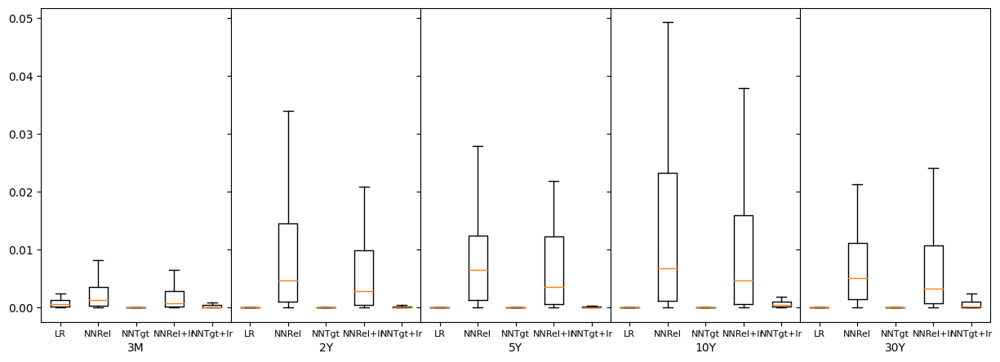

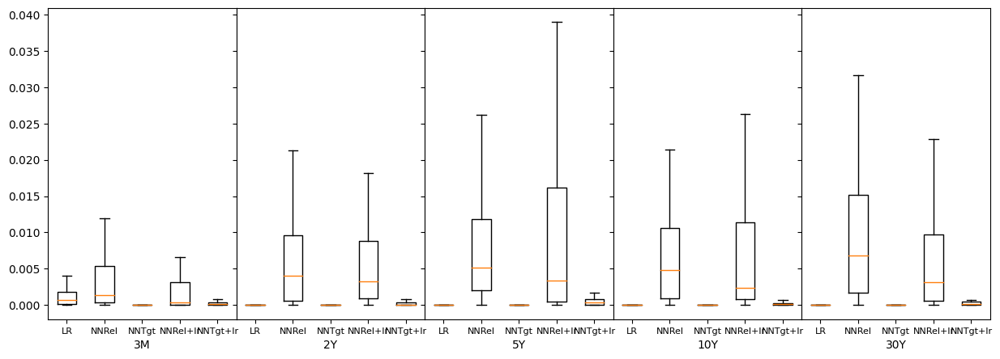

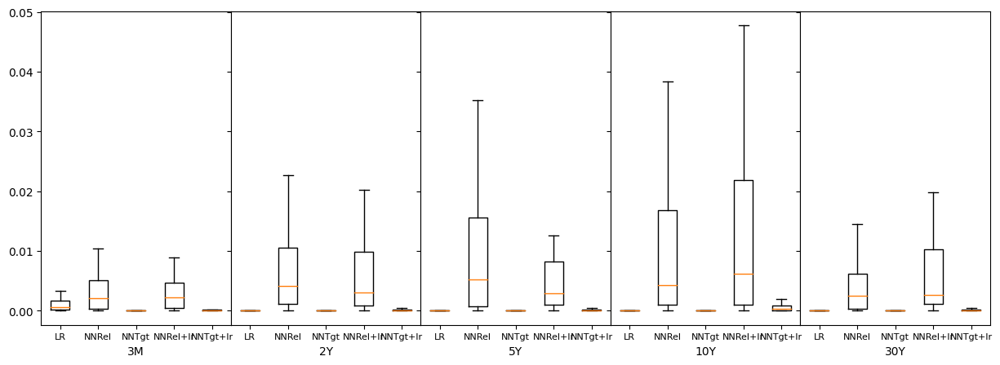

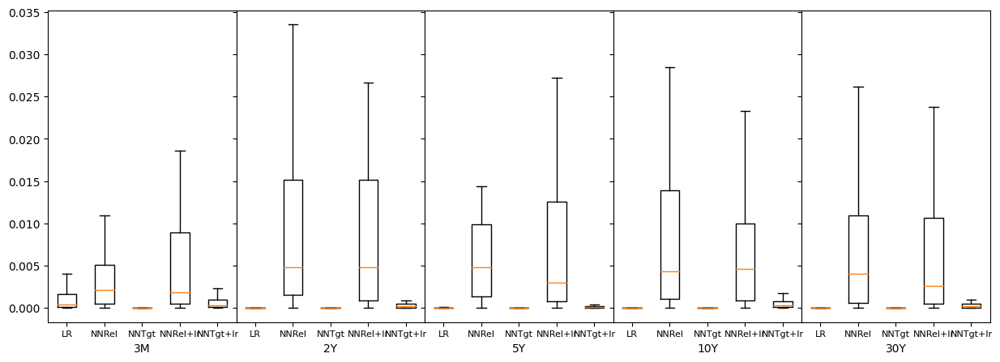

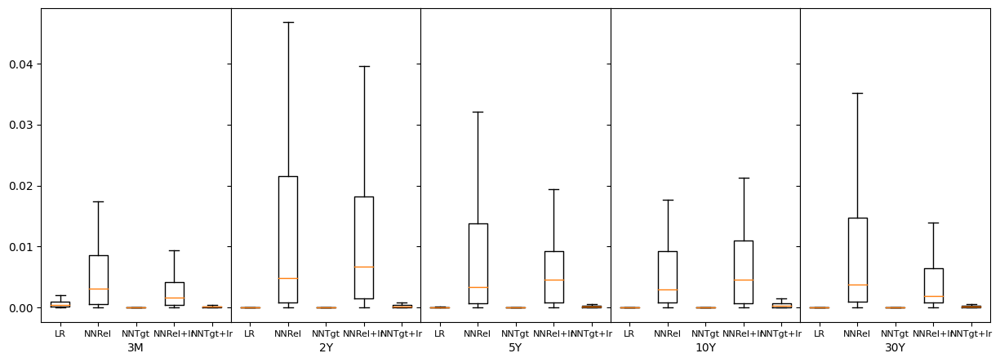

In [14]:
for i in range(len(horizons)):
    plot_function1(i)

In [15]:
table4_non_normalized = NN_RelFeat_non_normalized('GECU10YR_lag_1')

Epoch 1/800
33/33 [==============================] - 1s 10ms/step - loss: 3746780.0000 - mae: 1531.9170 - mse: 3746780.0000 - root_mean_squared_error: 1935.6600 - val_loss: 519935.0312 - val_mae: 570.1270 - val_mse: 519935.0312 - val_root_mean_squared_error: 721.0652
Epoch 2/800
33/33 [==============================] - 0s 3ms/step - loss: 511594.3125 - mae: 600.1558 - mse: 511594.3125 - root_mean_squared_error: 715.2582 - val_loss: 391141.1875 - val_mae: 535.1384 - val_mse: 391141.1875 - val_root_mean_squared_error: 625.4128
Epoch 3/800
33/33 [==============================] - 0s 3ms/step - loss: 380740.2188 - mae: 533.1875 - mse: 380740.2188 - root_mean_squared_error: 617.0415 - val_loss: 319769.7500 - val_mae: 481.4040 - val_mse: 319769.7500 - val_root_mean_squared_error: 565.4819
Epoch 4/800
33/33 [==============================] - 0s 3ms/step - loss: 326131.5000 - mae: 489.3381 - mse: 326131.5000 - root_mean_squared_error: 571.0792 - val_loss: 279269.1562 - val_mae: 447.9209 - val_

In [16]:
normalised_metrics=fig_5['GECU10YR_lag_1']#NN_RelFeat('GECU10Y_lag_1')
non_normalised_metrics=table4_non_normalized
table_4_dict={'Error':['MAE','MSE','RMSE'],
              'Normalised Mean':[normalised_metrics['mae'],
                                 normalised_metrics['mse'],
                                 normalised_metrics['rmse_values']],
              'Normalised Std Dev': [normalised_metrics['std_dev_mae'],
                                    normalised_metrics['std_dev_mse'],
                                    normalised_metrics['std_rmse']],
              
              'Non-Normalised Mean':[non_normalised_metrics['mae'],
                                 non_normalised_metrics['mse'],
                                 non_normalised_metrics['rmse_values']],
              'Non-Normalised Std Dev': [non_normalised_metrics['std_dev_mae'],
                                    non_normalised_metrics['std_dev_mse'],
                                    non_normalised_metrics['std_rmse']]
             }

In [17]:
#convert table 4 dict into dataframe
df_table4=pd.DataFrame.from_dict(table_4_dict)

In [18]:
df_table4

,Error,Normalised Mean,Normalised Std Dev,Non-Normalised Mean,Non-Normalised Std Dev
0,MAE,0.094979,0.071430,0.423419,0.322433
1,MSE,0.014123,0.017537,0.283247,0.347393
2,RMSE,0.118841,0.071430,0.532209,0.322433


In [19]:
d = {'Actual 10Y Yield': fig_5['Actual_Yield'], 'Predicted 10Y Yield': fig_5['Predicted_Yield']}

In [20]:
df = pd.DataFrame(data=d)

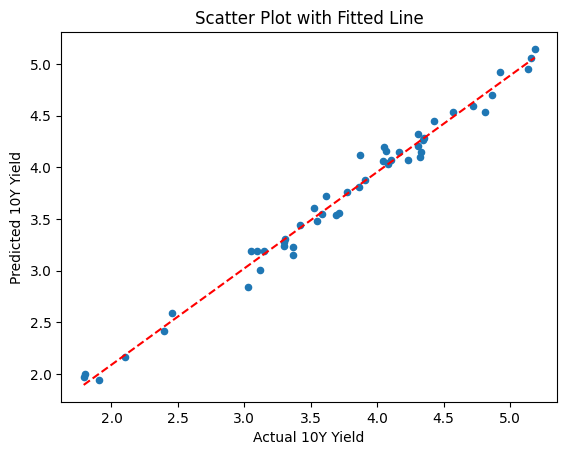

In [21]:
# Plotting the data

df = df.sort_values(by='Actual 10Y Yield')
df.plot(x='Actual 10Y Yield', y='Predicted 10Y Yield', kind='scatter', title='Scatter Plot with Fitted Line')

# Fit a line through the data using numpy.polyfit
fit = np.polyfit(df['Actual 10Y Yield'], df['Predicted 10Y Yield'], 1)

# Add the fitted line to the plot
plt.plot(df['Actual 10Y Yield'], np.polyval(fit, df['Actual 10Y Yield']), 'r--')


# Show the plot
plt.show()

In [22]:
def mlt_RelFeat(feature_of_Interest):
    
    '''
    Input: the feature that we are interested in. 
    
    returns a dictionary of metrics of the model
    metrics:
        mean sq error (mse)
        Standard dev of mse (std_dev_mse)
        MSE values: ((predictions - y_test_forecast)**2)
        
        metrics for MAE and RMSE
        
        The actual Yield and predicted yield
    
    '''
    
    
    #feature_of_Interest=[list of interested features]'GECU2YR_lag_1'
    import pandas as pd, numpy as np
    import numpy as np
    from sklearn.linear_model import LassoCV, MultiTaskLassoCV, Lasso
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_squared_error
    from sklearn.utils import resample
    from sklearn.preprocessing import StandardScaler,Normalizer
    import matplotlib.pyplot as plt
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Dropout
    from tensorflow.keras.metrics import RootMeanSquaredError
    from sklearn.linear_model import LinearRegression
    
    df=pd.read_csv(file_paths)
    df.columns = df.columns.str.replace(' ', '')
    df.set_index("Date",inplace=True)
    #df = df.loc[:,df.columns != "Date"]
    df.interpolate(method ='linear', limit_direction ='both',inplace=True)
    
    # Load your CSV data (replace with your file path)
    data = df

    # Define the target column names (using the last 5 columns)
    target_columns = data.columns[-5:]

    # Generate lagged features for all features
    features_with_lags = pd.DataFrame()
    for feature in data.columns:
        lagged_features = []
        for i in range(1, 22,5):
            lagged_feature = data[feature].shift(i).rename(f"{feature}_lag_{i}")
            lagged_features.append(lagged_feature)
        # Include the feature itself
        lagged_features.append(data[feature])
        features_with_lags = pd.concat([features_with_lags, *lagged_features], axis=1)
    features_with_lags.interpolate(method ='linear', limit_direction ='both',inplace=True)
    #features_with_lags.dropna(inplace=True)
    # Apply LASSO feature selection separately per target and per forecasting horizon
    selected_features = pd.DataFrame(index=features_with_lags.columns)
    #features_with_lags.dropna(inplace=True)
    filtered_target_columns = [col for col in features_with_lags.columns if any(target in col for target in target_columns)]
    
    target_columns=feature_of_Interest

    X = features_with_lags[features_with_lags.columns.difference(target_columns)]#df[:, :-5]
    y = features_with_lags[target_columns]#df[:, -5:]
    X_train, X_test, y_train, y_test = train_test_split(X[400:3400], y[400:3400], test_size=0.3,random_state=42)
    
    
    
    lasso_model = Lasso(alpha=4)
    lasso_model.fit(X_train, y_train)
    #selected_feature = np.sum(lasso_model.coef_ != 0)
    selected_columns = X_train.columns[lasso_model.coef_ != 0]
    
    
    #X_train, X_test, y_train, y_test = train_test_split(selected_columns[400:3400], y[400:3400], test_size=0.3, shuffle=True)
    # Assuming X_train and X_test are your feature sets
    #scaler = StandardScaler()
    #scaler.fit(X_train)
    X_train=X_train[list(selected_columns)]
    X_test=X_test[list(selected_columns)]
    # Normalize train and test sets
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    # Normalize train and test sets
    X_train_normalized = X_train
    X_test_normalized = X_test
    
    import random
    random.seed(42)  # Set a seed for reproducibility
    selected_indices = random.sample(range(len(X_test)), 50)
    X_test_forecast = X_test_normalized[selected_indices]
    y_test_forecast = y_test.iloc[selected_indices]  # Assuming y_test is your target variable
    
    # Define the model architecture
    model = Sequential()
    model.add(Dense(10, input_shape=(X_train_normalized.shape[1],), activation='relu'))
    #model.add(Dropout(0.2))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(len(feature_of_Interest), activation='linear'))
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse',RootMeanSquaredError()])
    
    # Train the model
    history = model.fit(X_train_normalized, y_train, epochs=500, batch_size=64, validation_data=(X_test_forecast, y_test_forecast))
    
    # Evaluate the model
    loss, mae, mse, rmse = model.evaluate(X_test_forecast, y_test_forecast)
    
    predictions = model.predict(X_test_forecast)
    mse = np.mean((predictions - y_test_forecast)**2)
    std_dev_mse = np.std((predictions - y_test_forecast.values)**2)
    mae = np.mean(np.abs(predictions - y_test_forecast.values))
    std_dev_mae = np.std(np.abs(predictions - y_test_forecast.values))
    rmse_values = np.sqrt(np.mean((predictions - y_test_forecast)**2))
    std_rmse = np.std(np.sqrt(np.mean((predictions - y_test_forecast)**2, axis=1)))
    mse_values=(predictions - y_test_forecast)**2
    if type(mse_values)==pd.DataFrame:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    elif type(mse_values)==np.ndarray:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    else:
        a={'mse':mse,'std_dev_mse':std_dev_mse,'mae':mae,'std_dev_mae':std_dev_mae,'rmse_values':rmse_values,
           'std_rmse':std_rmse,'mse_values':((predictions - y_test_forecast)**2), 'Actual_Yield':y_test_forecast,
           'Predicted_Yield':predictions
          }
    return a


In [23]:

horizons_mlt=[1,21]
list_mse_mlt=[]
for i in horizons_mlt:
    by_maturity_mlt=[]
    for j in yields:
        #print(j+str(i))
        target_=j+str(i)
        #print(target_)
        q=mlt_RelFeat([target_])
        by_maturity_mlt.append([q])
    list_mse_mlt.append(by_maturity_mlt)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.913e+00, tolerance: 3.975e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 8ms/step - loss: 7.2911 - mae: 2.3796 - mse: 7.2911 - root_mean_squared_error: 2.7002 - val_loss: 4.1098 - val_mae: 1.8016 - val_mse: 4.1098 - val_root_mean_squared_error: 2.0273
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.7797 - mae: 1.6518 - mse: 3.7797 - root_mean_squared_error: 1.9441 - val_loss: 1.7489 - val_mae: 1.1272 - val_mse: 1.7489 - val_root_mean_squared_error: 1.3224
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.3602 - mae: 0.9099 - mse: 1.3602 - root_mean_squared_error: 1.1663 - val_loss: 0.5010 - val_mae: 0.4852 - val_mse: 0.5010 - val_root_mean_squared_error: 0.7078
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.6791 - mae: 0.5636 - mse: 0.6791 - root_mean_squared_error: 0.8241 - val_loss: 0.2987 - val_mae: 0.3253 - val_mse: 0.2987 - val_root_mean_squared_error: 0.5465
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.594e-01, tolerance: 3.274e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 6.8278 - mae: 2.3318 - mse: 6.8278 - root_mean_squared_error: 2.6130 - val_loss: 4.1346 - val_mae: 1.7816 - val_mse: 4.1346 - val_root_mean_squared_error: 2.0334
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.0321 - mae: 1.4671 - mse: 3.0321 - root_mean_squared_error: 1.7413 - val_loss: 1.2088 - val_mae: 0.8496 - val_mse: 1.2088 - val_root_mean_squared_error: 1.0994
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9068 - mae: 0.7060 - mse: 0.9068 - root_mean_squared_error: 0.9522 - val_loss: 0.4885 - val_mae: 0.5427 - val_mse: 0.4885 - val_root_mean_squared_error: 0.6990
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.5316 - mae: 0.5460 - mse: 0.5316 - root_mean_squared_error: 0.7291 - val_loss: 0.4331 - val_mae: 0.5271 - val_mse: 0.4331 - val_root_mean_squared_error: 0.6581
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.038e-01, tolerance: 1.135e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 14.3957 - mae: 3.6619 - mse: 14.3957 - root_mean_squared_error: 3.7942 - val_loss: 11.9913 - val_mae: 3.3221 - val_mse: 11.9913 - val_root_mean_squared_error: 3.4628
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 8.4884 - mae: 2.6653 - mse: 8.4884 - root_mean_squared_error: 2.9135 - val_loss: 6.6621 - val_mae: 2.3900 - val_mse: 6.6621 - val_root_mean_squared_error: 2.5811
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 4.7696 - mae: 1.8830 - mse: 4.7696 - root_mean_squared_error: 2.1839 - val_loss: 3.7694 - val_mae: 1.7604 - val_mse: 3.7694 - val_root_mean_squared_error: 1.9415
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 3.2190 - mae: 1.5458 - mse: 3.2190 - root_mean_squared_error: 1.7941 - val_loss: 2.4284 - val_mae: 1.3945 - val_mse: 2.4284 - val_root_mean_squared_error: 1.5583
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - l

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.288e+00, tolerance: 3.936e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 4.1894 - mae: 1.7084 - mse: 4.1894 - root_mean_squared_error: 2.0468 - val_loss: 2.2626 - val_mae: 1.2394 - val_mse: 2.2626 - val_root_mean_squared_error: 1.5042
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 1.9979 - mae: 1.0694 - mse: 1.9979 - root_mean_squared_error: 1.4135 - val_loss: 1.2320 - val_mae: 0.8802 - val_mse: 1.2320 - val_root_mean_squared_error: 1.1099
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.2768 - mae: 0.8539 - mse: 1.2768 - root_mean_squared_error: 1.1300 - val_loss: 0.8071 - val_mae: 0.6822 - val_mse: 0.8071 - val_root_mean_squared_error: 0.8984
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9802 - mae: 0.7301 - mse: 0.9802 - root_mean_squared_error: 0.9900 - val_loss: 0.5960 - val_mae: 0.5476 - val_mse: 0.5960 - val_root_mean_squared_error: 0.7720
Epoch 5/500
33/33 [==============================] - 0s 3ms/

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.747e+00, tolerance: 3.243e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 4.1986 - mae: 1.8556 - mse: 4.1986 - root_mean_squared_error: 2.0491 - val_loss: 3.2473 - val_mae: 1.6065 - val_mse: 3.2473 - val_root_mean_squared_error: 1.8020
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 2.1535 - mae: 1.1905 - mse: 2.1535 - root_mean_squared_error: 1.4675 - val_loss: 1.5398 - val_mae: 1.0653 - val_mse: 1.5398 - val_root_mean_squared_error: 1.2409
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 1.2709 - mae: 0.8737 - mse: 1.2709 - root_mean_squared_error: 1.1274 - val_loss: 0.8116 - val_mae: 0.7174 - val_mse: 0.8116 - val_root_mean_squared_error: 0.9009
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 0.9322 - mae: 0.6963 - mse: 0.9322 - root_mean_squared_error: 0.9655 - val_loss: 0.5293 - val_mae: 0.4955 - val_mse: 0.5293 - val_root_mean_squared_error: 0.7275
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.485e-01, tolerance: 2.026e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 8ms/step - loss: 6.9489 - mae: 2.4850 - mse: 6.9489 - root_mean_squared_error: 2.6361 - val_loss: 5.4648 - val_mae: 2.1621 - val_mse: 5.4648 - val_root_mean_squared_error: 2.3377
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 3.6225 - mae: 1.6830 - mse: 3.6225 - root_mean_squared_error: 1.9033 - val_loss: 2.9069 - val_mae: 1.5693 - val_mse: 2.9069 - val_root_mean_squared_error: 1.7050
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 2.0277 - mae: 1.2255 - mse: 2.0277 - root_mean_squared_error: 1.4240 - val_loss: 1.5659 - val_mae: 1.1244 - val_mse: 1.5659 - val_root_mean_squared_error: 1.2513
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 1.4193 - mae: 1.0074 - mse: 1.4193 - root_mean_squared_error: 1.1914 - val_loss: 1.0409 - val_mae: 0.8899 - val_mse: 1.0409 - val_root_mean_squared_error: 1.0202
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - loss:

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.198e-01, tolerance: 1.261e-01
  model = cd_fast.enet_coordinate_descent(


33/33 [==============================] - 1s 9ms/step - loss: 12.1092 - mae: 3.3621 - mse: 12.1092 - root_mean_squared_error: 3.4798 - val_loss: 9.1962 - val_mae: 2.8949 - val_mse: 9.1962 - val_root_mean_squared_error: 3.0325
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 6.4743 - mae: 2.3263 - mse: 6.4743 - root_mean_squared_error: 2.5445 - val_loss: 3.7708 - val_mae: 1.6366 - val_mse: 3.7708 - val_root_mean_squared_error: 1.9419
Epoch 3/500
33/33 [==============================] - 0s 4ms/step - loss: 2.7593 - mae: 1.3771 - mse: 2.7593 - root_mean_squared_error: 1.6611 - val_loss: 1.9382 - val_mae: 1.1989 - val_mse: 1.9382 - val_root_mean_squared_error: 1.3922
Epoch 4/500
33/33 [==============================] - 0s 4ms/step - loss: 1.7794 - mae: 1.1021 - mse: 1.7794 - root_mean_squared_error: 1.3339 - val_loss: 1.5308 - val_mae: 1.1054 - val_mse: 1.5308 - val_root_mean_squared_error: 1.2373
Epoch 5/500
33/33 [==============================] - 0s 3ms/step - los

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.204e-01, tolerance: 1.102e-01
  model = cd_fast.enet_coordinate_descent(


Epoch 1/500
33/33 [==============================] - 1s 9ms/step - loss: 14.3522 - mae: 3.6276 - mse: 14.3522 - root_mean_squared_error: 3.7884 - val_loss: 12.9573 - val_mae: 3.4500 - val_mse: 12.9573 - val_root_mean_squared_error: 3.5996
Epoch 2/500
33/33 [==============================] - 0s 3ms/step - loss: 9.4670 - mae: 2.8118 - mse: 9.4670 - root_mean_squared_error: 3.0768 - val_loss: 8.2325 - val_mae: 2.6869 - val_mse: 8.2325 - val_root_mean_squared_error: 2.8692
Epoch 3/500
33/33 [==============================] - 0s 3ms/step - loss: 5.8797 - mae: 2.1561 - mse: 5.8797 - root_mean_squared_error: 2.4248 - val_loss: 4.6577 - val_mae: 2.0010 - val_mse: 4.6577 - val_root_mean_squared_error: 2.1582
Epoch 4/500
33/33 [==============================] - 0s 3ms/step - loss: 3.3030 - mae: 1.5322 - mse: 3.3030 - root_mean_squared_error: 1.8174 - val_loss: 1.8631 - val_mae: 1.2158 - val_mse: 1.8631 - val_root_mean_squared_error: 1.3649
Epoch 5/500
33/33 [==============================] - 0s 

In [24]:

axis=['3M','2Y','5Y','10Y','30Y']
def plot_stl_mtl(i):
    
    '''
    
    Function generates the graphs
    
    Input: number of horizons 
    
    returns the plot data as a nested list
    
    '''
    
    data = []

    for j in range(0, 5):
        list1 = []
        key = axis[j]
        if isinstance(list_mse[i][j][1], pd.DataFrame):
            list1.append(list_mse[i][j][1].values.flatten())
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        elif isinstance(list_mse[i][j][1], np.ndarray):
            list1.append(list_mse[i][j][1].flatten())
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        else:
            list1.append(list_mse[i][j][1])
            mse_values = list_mse_mlt[i][j][0]['mse_values']
            if isinstance(mse_values, pd.DataFrame):
                list1.append(mse_values.values.flatten())
            elif isinstance(mse_values, np.ndarray):
                list1.append(mse_values.flatten())
            else:
                list1.append(mse_values)
        data.append([key, list1])
    attemptlist = ['STL','MTL'] 
    fig, axes = plt.subplots(ncols= len(data), sharey=True,figsize=(15, 5))
    fig.subplots_adjust(wspace=0)
    for ax,d in zip(axes,data):     
        ax.boxplot([d[1][attemptlist.index(attempt)] for attempt in attemptlist],showfliers=False)
        ax.set(xticklabels=attemptlist, xlabel=d[0])
        ax.set_xticklabels(attemptlist, fontsize=8)
    plt.show()

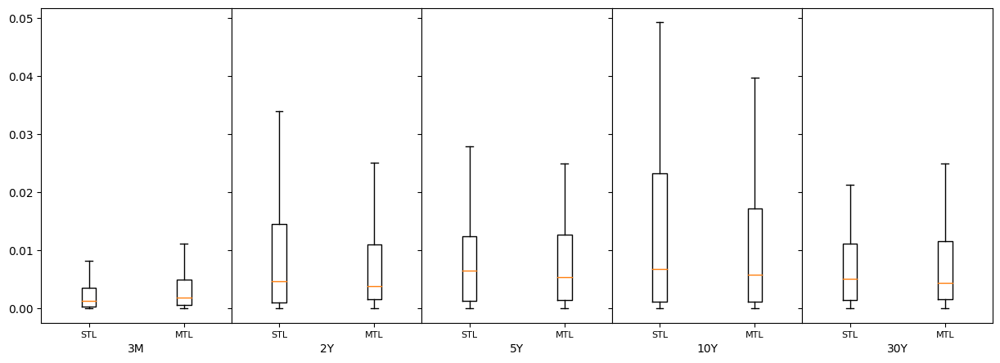

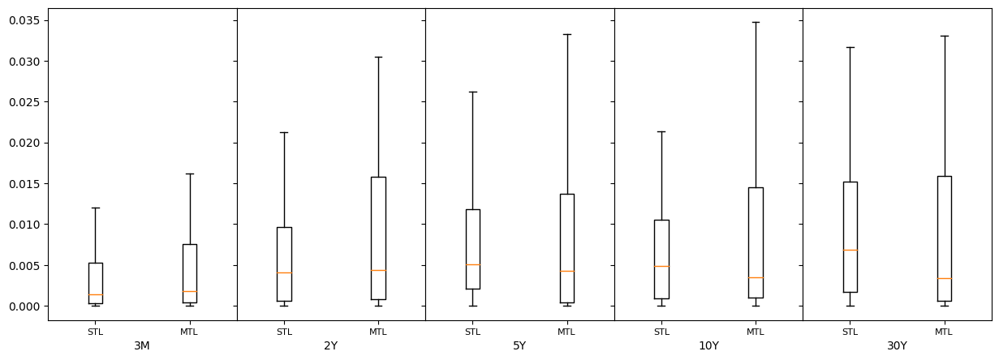

In [25]:
for i in range(len(horizons_mlt)):
    plot_stl_mtl(i)
    